# Credit EDA case study - November - 2022
### Submitted by : Ritika Sen

# 1. Basic 

## 1.1 Import important libraries 

In [1]:
# Pandas is a software library written for the Python programming language for data manipulation and analysis.
import pandas as pd
# NumPy is a library for the Python programming language, adding support for large, multi-dimensional arrays and matrices, along with a large collection  of high-level mathematical functions to operate on these arrays.
import numpy as np
# Matplotlib is a plotting library for python and pyplot gives us a MatLab like plotting framework. We will use this in our plotter function to plot data.
import matplotlib.pyplot as plt
%matplotlib inline
#Plotly provides number of trace objects such as scatter, bar, pie, heatmap etc. and each is returned by respective functions in graph_objs functions.
import plotly.graph_objs as go
#To create subplots
from plotly.subplots import make_subplots
#The plotly.express module (usually imported as px) contains functions that can create entire figures at once, and is referred to as Plotly Express or PX.
import plotly.express as px
#Seaborn is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics
#This affects things like the color of the axes, whether a grid is enabled by default, and other aesthetic elements.
import seaborn as sns;sns.set(style="ticks", color_codes=True)
# Warning Library
import warnings  
# Ignore all warnings
warnings.filterwarnings("ignore")
# import itertools to import
import itertools
# For kde plot visualization
import plotly.figure_factory as ff

## 1.2 Setting option to view data more clearly

In [2]:
# Setting this option will print all collumns of a dataframe
pd.set_option('display.max_columns', None)
# Setting this option will print all of the data in a feature
pd.set_option('display.max_colwidth', None)
# Setting this option will print all of the data in a row
pd.set_option('display.max_rows',None)

## 1.3 Read Data

- prev_app_data : previous_application.csv
- app_data : application_data.csv
- des : Description.csv

In [3]:
# We will use read_csv method to read data 

app_data = pd.read_csv("application_data.csv")
des = pd.read_csv("Description.csv")

In [4]:
prev_app_data = pd.read_csv("previous_application.csv")

## 1.4 Functions used for EDA

### 1.4.1 Features with NaN values 

Define a function to get <code>Zero Values</code> , <code>Missing Values</code> ,<code>% of Missing Values</code> ,<code>Total Zero and Missing Values</code> ,<code>%Total Zero and Missing Values</code> ,<code>Data Type</code> 

In [5]:
def missing_zero_values_table(df):
        zero_val = (df == 0.00).astype(int).sum(axis=0)
        mis_val = df.isnull().sum()
        mis_val_percent = 100 * df.isnull().sum() / len(df)
        mz_table = pd.concat([zero_val, mis_val, mis_val_percent], axis=1)
        mz_table = mz_table.rename(
        columns = {0 : 'Zero Values', 1 : 'Missing Values', 2 : '% of Missing Values'})
        mz_table['Total Zero and Missing Values'] = mz_table['Zero Values'] + mz_table['Missing Values']
        mz_table['% Total Zero and Missing Values'] = 100 * mz_table['Total Zero and Missing Values'] / len(df)
        mz_table['Data Type'] = df.dtypes
        mz_table = mz_table[
            mz_table.iloc[:,1] != 0].sort_values(
        '% of Missing Values', ascending=False).round(2)
        print ("Your selected dataframe has " + str(df.shape[1]) + " columns and " + str(df.shape[0]) + " Rows.\n"      
            "There are " + str(mz_table.shape[0]) +
              " columns that have missing values.")
        mz_table.to_csv("feaatures_NaN.csv", index = False)
        return mz_table

### 1.4.2 Number of Unique values present in Feature

Define a function to get <code>Features</code>, <code>Count_Unique_values</code>, <code>Unique_values</code>

In [6]:
def number_of_unique_values(df,feat):
    Features = []
    count_unique_values = []
    unique_values = []
    missing_values_count = []
    data_type = []
    
    for feature in df[feat].columns:
        Features.append(feature)
        count_unique_values.append(len(df[feature].unique()))
        unique_values.append(df[feature].unique())
        missing_values_count.append(df[feature].isna().sum())
        data_type.append(df[feature].dtypes)
        
        table = pd.DataFrame({'Features':Features, 'Count_Unique_values':count_unique_values, 'Unique_values':unique_values, "Missing_values_count":missing_values_count, "Data_type":data_type})
    table = table.sort_values(by='Count_Unique_values')
    table.reset_index(drop=True,inplace=True)
    return table

# 2. DATA SET: "application_data.csv"

## 2.1 Data Understanding

1. Shape of dataset
2. Descriptive view and Datatype of features
3. Zero and missing values present in Data
4. Summary of Data Understanding

In [7]:
# Content of the data
app_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

### 2.1.1 Shape of dataset

In [8]:
# Print the number of rows and columns
print(app_data.shape)

(307511, 122)


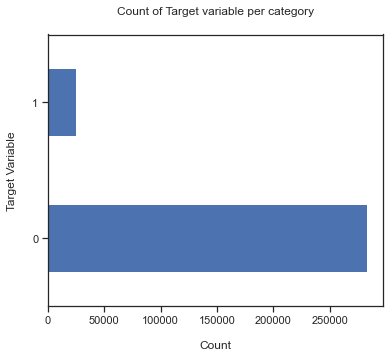

In [9]:
# Plot graph to see target feature properly
app_data['TARGET'].value_counts().plot(kind='barh', figsize=(6,5))
plt.xlabel("Count", labelpad=15)
plt.ylabel("Target Variable", labelpad=15)
plt.title("Count of Target variable per category",y = 1.05);

In [10]:
# Find the percentage of defaulter and repayer
(app_data['TARGET'].value_counts()/app_data.shape[0])*100

0    91.927118
1     8.072882
Name: TARGET, dtype: float64

- Most of the loans are pain on time. TARGET (0)
- Data is highly imbalanced 
- So we will analyse the data to get some insights

### 2.1.2 Descriptive view and Datatype of features

In [11]:
# Print data describtion
print(app_data.describe())

          SK_ID_CURR         TARGET   CNT_CHILDREN  AMT_INCOME_TOTAL  \
count  307511.000000  307511.000000  307511.000000      3.075110e+05   
mean   278180.518577       0.080729       0.417052      1.687979e+05   
std    102790.175348       0.272419       0.722121      2.371231e+05   
min    100002.000000       0.000000       0.000000      2.565000e+04   
25%    189145.500000       0.000000       0.000000      1.125000e+05   
50%    278202.000000       0.000000       0.000000      1.471500e+05   
75%    367142.500000       0.000000       1.000000      2.025000e+05   
max    456255.000000       1.000000      19.000000      1.170000e+08   

         AMT_CREDIT    AMT_ANNUITY  AMT_GOODS_PRICE  \
count  3.075110e+05  307499.000000     3.072330e+05   
mean   5.990260e+05   27108.573909     5.383962e+05   
std    4.024908e+05   14493.737315     3.694465e+05   
min    4.500000e+04    1615.500000     4.050000e+04   
25%    2.700000e+05   16524.000000     2.385000e+05   
50%    5.135310e+05  

In [12]:
# Print dtypes of the data
dtypes_app_data = app_data.dtypes
dtypes_app_data

SK_ID_CURR                        int64
TARGET                            int64
NAME_CONTRACT_TYPE               object
CODE_GENDER                      object
FLAG_OWN_CAR                     object
FLAG_OWN_REALTY                  object
CNT_CHILDREN                      int64
AMT_INCOME_TOTAL                float64
AMT_CREDIT                      float64
AMT_ANNUITY                     float64
AMT_GOODS_PRICE                 float64
NAME_TYPE_SUITE                  object
NAME_INCOME_TYPE                 object
NAME_EDUCATION_TYPE              object
NAME_FAMILY_STATUS               object
NAME_HOUSING_TYPE                object
REGION_POPULATION_RELATIVE      float64
DAYS_BIRTH                        int64
DAYS_EMPLOYED                     int64
DAYS_REGISTRATION               float64
DAYS_ID_PUBLISH                   int64
OWN_CAR_AGE                     float64
FLAG_MOBIL                        int64
FLAG_EMP_PHONE                    int64
FLAG_WORK_PHONE                   int64


Count of each datatype : 
float64    65
int64      41
object     16
dtype: int64 

Percentage of each datatype % :
float64    53.28
int64      33.61
object     13.11
dtype: float64 



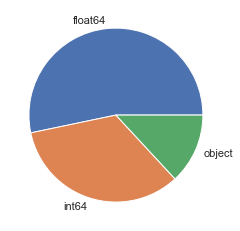

In [13]:
# Total count of each data type
print("Count of each datatype : ")
print(dtypes_app_data.value_counts(),"\n")
print("Percentage of each datatype % :")
print((dtypes_app_data.value_counts()/dtypes_app_data.value_counts().sum()*100).round(2),'\n')
dtypes_app_data.value_counts().plot.pie()
plt.xlabel("")
plt.ylabel("")
plt.show()

### 2.1.3 Zero and Missing values present in data

- Many columns have a lot of missing data i.e more than 30%. Some columns have few missing data ( 13% - 20% ). 
- For features with high number of missing values we will drop them
- For features less number of missing values we can fill with mean or median values or we can predict the missing values with regression.

Call function to get <code>Zero Values</code> , <code>Missing Values</code> ,<code>% of Missing Values</code> ,<code>Total Zero and Missing Values</code> ,<code>% Total Zero and Missing Values</code> ,<code>Data Type</code> from the data

In [14]:
null_app_data_table = missing_zero_values_table(app_data)
null_app_data_table

Your selected dataframe has 122 columns and 307511 Rows.
There are 67 columns that have missing values.


,Zero Values,Missing Values,% of Missing Values,Total Zero and Missing Values,% Total Zero and Missing Values,Data Type
COMMONAREA_MEDI,8691,214865,69.87,223556,72.70,float64
COMMONAREA_AVG,8442,214865,69.87,223307,72.62,float64
COMMONAREA_MODE,9690,214865,69.87,224555,73.02,float64
NONLIVINGAPARTMENTS_MEDI,56097,213514,69.43,269611,87.68,float64
NONLIVINGAPARTMENTS_MODE,59255,213514,69.43,272769,88.70,float64
NONLIVINGAPARTMENTS_AVG,54549,213514,69.43,268063,87.17,float64
FONDKAPREMONT_MODE,0,210295,68.39,210295,68.39,object
LIVINGAPARTMENTS_MODE,519,210199,68.35,210718,68.52,float64
LIVINGAPARTMENTS_MEDI,433,210199,68.35,210632,68.50,float64
LIVINGAPARTMENTS_AVG,418,210199,68.35,210617,68.49,float64


### 2.1.4 Summary of Data Understanding

- There are `3,07,511` number of rows and `122` number of columns
- There are 3 types of datatypes available:
    - float64 : `65`
    - int64 : `41`
    - object/string : `16`
- There are negative values in some of columns.
- There are days and hour which are not in format.
- There are `67` columns that have missing values majority of them have more that `40%` missing values.

## 2.2 Data Manipulation




- There is no rule to drop the features having more than 40% missing values, if the information is important then keep it otherwise drop it simple as that.
- Most of the columns are normalized information and description is bit unclear, so we will remove these columns
- I will keep keep some columns like `OWN_CAR_AGE` and `OCCUPATION_TYPE` for further analysis.

1. Drop columns with more than 40% null values
2. Analyze FLAG data and Drop unwanted columns
3. Drop columns which are not required
4. Filling missing values and changing required values
4. Standardization
5. Handling Outliers
6. Summary

### 2.2.1 Drop columns with more than 40% null values 

In [15]:
# According to the above missing percentage result in Data understanding section there are a 67 missing columns with missing values 
# we need OWN_CAR_AGE, so we will keep it
missing_value = null_app_data_table[null_app_data_table['% of Missing Values'] > 40]
missing_value_40 = missing_value['% of Missing Values']
missing_value_40_col = list(missing_value_40.index)
missing_value_40_col.remove('OWN_CAR_AGE')
missing_value_40_col.remove('EXT_SOURCE_1')

In [16]:
print(missing_value_40_col,"\n\n\n There are", len(missing_value_40_col), "columns with more than 40% missing values")

['COMMONAREA_MEDI', 'COMMONAREA_AVG', 'COMMONAREA_MODE', 'NONLIVINGAPARTMENTS_MEDI', 'NONLIVINGAPARTMENTS_MODE', 'NONLIVINGAPARTMENTS_AVG', 'FONDKAPREMONT_MODE', 'LIVINGAPARTMENTS_MODE', 'LIVINGAPARTMENTS_MEDI', 'LIVINGAPARTMENTS_AVG', 'FLOORSMIN_MODE', 'FLOORSMIN_MEDI', 'FLOORSMIN_AVG', 'YEARS_BUILD_MODE', 'YEARS_BUILD_MEDI', 'YEARS_BUILD_AVG', 'LANDAREA_AVG', 'LANDAREA_MEDI', 'LANDAREA_MODE', 'BASEMENTAREA_MEDI', 'BASEMENTAREA_AVG', 'BASEMENTAREA_MODE', 'NONLIVINGAREA_MEDI', 'NONLIVINGAREA_MODE', 'NONLIVINGAREA_AVG', 'ELEVATORS_MEDI', 'ELEVATORS_MODE', 'ELEVATORS_AVG', 'WALLSMATERIAL_MODE', 'APARTMENTS_MODE', 'APARTMENTS_MEDI', 'APARTMENTS_AVG', 'ENTRANCES_MODE', 'ENTRANCES_AVG', 'ENTRANCES_MEDI', 'LIVINGAREA_MEDI', 'LIVINGAREA_MODE', 'LIVINGAREA_AVG', 'HOUSETYPE_MODE', 'FLOORSMAX_MEDI', 'FLOORSMAX_AVG', 'FLOORSMAX_MODE', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BEGINEXPLUATATION_MEDI', 'YEARS_BEGINEXPLUATATION_MODE', 'TOTALAREA_MODE', 'EMERGENCYSTATE_MODE'] 


 There are 47 columns wit

In [17]:
# We will drop all these columns 
app_data = app_data.drop(columns=(missing_value_40_col))
app_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,NaN,0.650442,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,NaN,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,NaN,0.322738,NaN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [18]:
print("After dropping columns with more that 40% we have ",app_data.shape[0]," rows and ",app_data.shape[1]," columns.")

After dropping columns with more that 40% we have  307511  rows and  75  columns.


In [19]:
# Now we have dropped unwanted columns 
# These are the remaining ones
# We have 2 normalized columns in this data, those are EXT_SOURCE_2 and EXT_SOURCE_3
app_data.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
       'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE',
       'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_3

In [20]:
# Now we will check if there is any connection between these EXT_SOURCE with target variable or not
ex = ['EXT_SOURCE_2', 'EXT_SOURCE_3']
app_data[ex].head(10)

,EXT_SOURCE_2,EXT_SOURCE_3
0,0.262949,0.139376
1,0.622246,NaN
2,0.555912,0.729567
3,0.650442,NaN
4,0.322738,NaN
5,0.354225,0.621226
6,0.724000,0.492060
7,0.714279,0.540654
8,0.205747,0.751724
9,0.746644,NaN


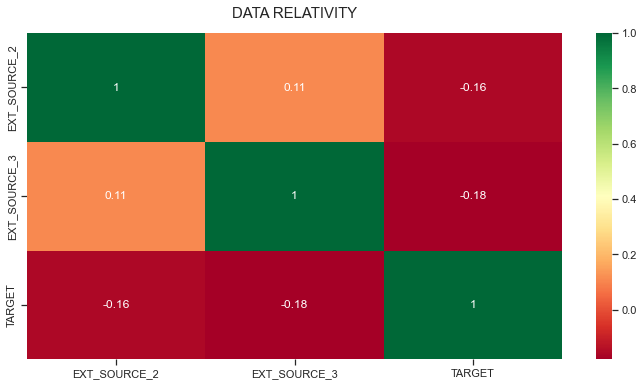

In [21]:
# we will use heatmap to find the relationshio between these two features with target variable
plt.figure(figsize= [12,6]) 
sns.heatmap(app_data[ex+["TARGET"]].corr(), cmap="RdYlGn",annot=True)
plt.title("DATA RELATIVITY", fontdict={"fontsize":15}, pad=15)
plt.show() #see the graph for relativity

We can see the relationship is very poor but we will keep these columns for future analysis


In [22]:
app_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,1,0,1,0,0,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,NaN,0.650442,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,NaN,1,1,0,1,0,0,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,NaN,0.322738,NaN,0.0,0.0,0.0,0.0,-1106.0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


### 2.2.2 Analyze FLAG data and Drop unwanted columns

In [23]:
# We will create a dataframe containing all flag columns and then plot bar graphs for each column with respect to target column
# Adding all flags columns in variable "flag_col"
flag_col = [column for column in app_data.columns if "FLAG" in column]

In [24]:
# We will make another dataframe containing flag columns and target column
data_flag = app_data[flag_col + ["TARGET"]]
data_flag.head()

,FLAG_OWN_CAR,FLAG_OWN_REALTY,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,TARGET
0,N,Y,1,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,N,N,1,1,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Y,Y,1,1,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,N,Y,1,1,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,N,Y,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [25]:
# Changing 1 to Defaulter and 0 to Repayer in target column
app_data['TARGET'] = app_data["TARGET"].replace({1:"Defaulter", 0:"Repayer"})

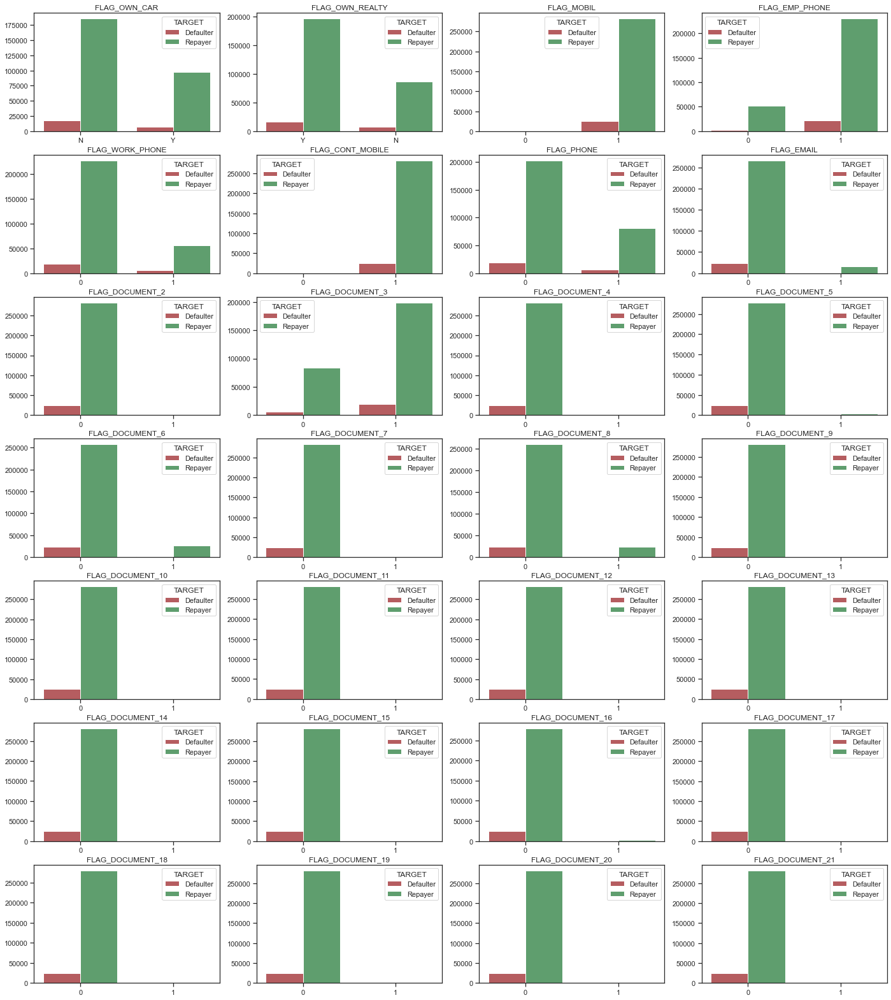

In [26]:
# Now we will visualize the data using plotly
plt.figure(figsize=[24,28])
for i,j in itertools.zip_longest(flag_col,range(len(flag_col))):
    plt.subplot(7,4,j+1)
    sns.countplot(app_data[i], hue=app_data["TARGET"], palette= ["r",'g'])
    plt.xlabel("")
    plt.ylabel("")
    plt.title(i)

In [27]:
app_data['TARGET'] = app_data["TARGET"].replace({"Defaulter":1, "Repayer":0})

We can see there are a lot of un-important columns , so we will remove all the unwanted columns

- Columns mentioned below are important
     - `FLAG_OWN_REALTY`
     - `FLAG_OWN_CAR`
     
So we will keep these columns

In [28]:
# drop required columns data_flag so that we can drop unwanted columns from app_data
data_flag.drop(['FLAG_OWN_REALTY', 'TARGET', 'FLAG_OWN_CAR',"FLAG_EMP_PHONE"], axis=1, inplace=True)

In [29]:
app_data = app_data.drop(columns=data_flag)

In [30]:
print("After dropping we are left with ",app_data.shape[0]," rows and ",app_data.shape[1]," columns")

After dropping we are left with  307511  rows and  50  columns


In [31]:
# Lets check the data again
app_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_EMP_PHONE,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,2.0,2.0,2.0,2.0,-1134.0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,1.0,0.0,1.0,0.0,-828.0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,0.0,0.0,0.0,0.0,-815.0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,297000.0,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,Laborers,2.0,2,2,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,NaN,0.650442,NaN,2.0,0.0,2.0,0.0,-617.0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,513000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,NaN,1,Core staff,1.0,2,2,THURSDAY,11,0,0,0,0,1,1,Religion,NaN,0.322738,NaN,0.0,0.0,0.0,0.0,-1106.0,0.0,0.0,0.0,0.0,0.0,0.0


### 2.2.3 Drop columns which are not required

In [32]:
app_data.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS',
       'NAME_HOUSING_TYPE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH',
       'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
       'FLAG_EMP_PHONE', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION',
       'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY',
       'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY',
       'ORGANIZATION_TYPE', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DE

In [33]:
unwanted_cols =['NAME_TYPE_SUITE', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 
'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR',
'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK',
'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT',
'AMT_REQ_CREDIT_BUREAU_YEAR']

In [34]:
app_data = app_data.drop(columns=unwanted_cols)
app_data.shape

(307511, 35)

In [35]:
print(app_data.columns)
print("\n\nThese are the required columns we will be working on for further analysis purpose.")
print("We have ",app_data.shape[0]," rows and ",app_data.shape[1]," columns in our dataset.\n\n")
print(app_data.isnull().sum())
print("As we have already dropped all the unwanted columns we can see we are left with some columns with less null values. We will fill these columns with median/ mean values.")

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_EMP_PHONE',
       'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1',
       'EXT_SOURCE_2', 'EXT_SOURCE_3'],
      dtype='object')


These are the required columns we will be working on for further analysis purpose.
We have  307511  rows and  35  columns in our dataset.


SK_ID_CURR                          

### 2.2.4 Filling missing values and changing required values

Here we conclude that

- `FLAG_OWN_REALTY` has two types of values `Y` and `N`. We will change this to `1` and `0`
- In `OCCUPATION_TYPE` there are a lot of missing values we will fill these values with `Unknown`
- Fill median values in following column `AMT_ANNUITY`
- Work with `XNA` values of `CODE_GENDER` column
- Work with `XNA` values of `ORGANISATION_TYPE` column

In [36]:
# Changing Y to 1 and N to 0 of FLAG_OWN_CAR and FLAG_OWN_REALTY columns
app_data['FLAG_OWN_REALTY'] = app_data["FLAG_OWN_REALTY"].replace({"Y":1, "N":0}).astype("int64")
# check if it is changed or not
app_data[ "FLAG_OWN_REALTY"].head()

0    1
1    0
2    1
3    1
4    1
Name: FLAG_OWN_REALTY, dtype: int64

In [37]:
app_data.OCCUPATION_TYPE.value_counts()

Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

In [38]:
(app_data.OCCUPATION_TYPE.isna().sum()/app_data.shape[0]*100).round(2)

31.35

In [39]:
#from above it looks like this columnn is categorical one and have missing values of 31.35%. 
#to fix this we will impute another category as "Unknown" for the missing values.
app_data.OCCUPATION_TYPE = app_data.OCCUPATION_TYPE.fillna("Unknown")
# Check if the missing values are filled with Unknown or not
app_data.OCCUPATION_TYPE.value_counts()

Unknown                  96391
Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

In [40]:
px.bar(
    data_frame=app_data.groupby(by=["OCCUPATION_TYPE"]).size().reset_index(name="Counts").sort_values("Counts",ascending=False),
    y= "OCCUPATION_TYPE",
    x= "Counts",
    title= " Occupation Type  ",
    height=600,
    width=1000
)

In [41]:
app_data.isna().sum()

SK_ID_CURR                          0
TARGET                              0
NAME_CONTRACT_TYPE                  0
CODE_GENDER                         0
FLAG_OWN_CAR                        0
FLAG_OWN_REALTY                     0
CNT_CHILDREN                        0
AMT_INCOME_TOTAL                    0
AMT_CREDIT                          0
AMT_ANNUITY                        12
AMT_GOODS_PRICE                   278
NAME_INCOME_TYPE                    0
NAME_EDUCATION_TYPE                 0
NAME_FAMILY_STATUS                  0
NAME_HOUSING_TYPE                   0
REGION_POPULATION_RELATIVE          0
DAYS_BIRTH                          0
DAYS_EMPLOYED                       0
DAYS_REGISTRATION                   0
DAYS_ID_PUBLISH                     0
OWN_CAR_AGE                    202929
FLAG_EMP_PHONE                      0
OCCUPATION_TYPE                     0
WEEKDAY_APPR_PROCESS_START          0
HOUR_APPR_PROCESS_START             0
REG_REGION_NOT_LIVE_REGION          0
REG_REGION_N

In [42]:
# Filling missing values of AMT_ANNUITY with median values
values = app_data['AMT_ANNUITY'].median()
app_data.loc[app_data['AMT_ANNUITY'].isnull(),'AMT_ANNUITY'] = values

In [43]:
app_data.isna().sum()

SK_ID_CURR                          0
TARGET                              0
NAME_CONTRACT_TYPE                  0
CODE_GENDER                         0
FLAG_OWN_CAR                        0
FLAG_OWN_REALTY                     0
CNT_CHILDREN                        0
AMT_INCOME_TOTAL                    0
AMT_CREDIT                          0
AMT_ANNUITY                         0
AMT_GOODS_PRICE                   278
NAME_INCOME_TYPE                    0
NAME_EDUCATION_TYPE                 0
NAME_FAMILY_STATUS                  0
NAME_HOUSING_TYPE                   0
REGION_POPULATION_RELATIVE          0
DAYS_BIRTH                          0
DAYS_EMPLOYED                       0
DAYS_REGISTRATION                   0
DAYS_ID_PUBLISH                     0
OWN_CAR_AGE                    202929
FLAG_EMP_PHONE                      0
OCCUPATION_TYPE                     0
WEEKDAY_APPR_PROCESS_START          0
HOUR_APPR_PROCESS_START             0
REG_REGION_NOT_LIVE_REGION          0
REG_REGION_N

In [44]:
# Working with XNA values of CODE_GENDER column
app_data['CODE_GENDER'].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

We can see there are 4 `XNA` values in gender column. We can also see that majority of gender is female so we can replace it to `F` as it will not affect the data.

In [45]:
app_data['CODE_GENDER'] = app_data['CODE_GENDER'].replace("XNA","F")
app_data['CODE_GENDER'].value_counts()

F    202452
M    105059
Name: CODE_GENDER, dtype: int64

In [46]:
print("Hence, XNA has been replaced.")

Hence, XNA has been replaced.


In [47]:
# Working with XNA values of ORGANISATION_TYPE column
app_data['ORGANIZATION_TYPE'].value_counts(normalize=True)*100

Business Entity Type 3    22.110429
XNA                       18.007161
Self-employed             12.491260
Other                      5.425172
Medicine                   3.639870
Business Entity Type 2     3.431747
Government                 3.383294
School                     2.891929
Trade: type 7              2.546576
Kindergarten               2.237318
Construction               2.185613
Business Entity Type 1     1.945947
Transport: type 4          1.755384
Trade: type 3              1.135569
Industry: type 9           1.095245
Industry: type 3           1.065978
Security                   1.055897
Housing                    0.961917
Industry: type 11          0.879318
Military                   0.856555
Bank                       0.815255
Agriculture                0.798020
Police                     0.761274
Transport: type 2          0.716722
Postal                     0.701438
Security Ministries        0.641928
Trade: type 2              0.617864
Restaurant                 0

We can see there are total `3,07,511` rows out of which we have `55,374` rows having XNA values i.e `18%` of data has XNA values. 
Hence, we will drop these rows as it will not have any major impact on our dataset.

In [48]:
app_data = app_data.drop(app_data.loc[app_data['ORGANIZATION_TYPE'] == 'XNA'].index)
app_data[app_data['ORGANIZATION_TYPE'] == 'XNA'].shape[0]

0

Hence, We dropped it

### 2.2.5 Standardization

- Convert columns `DAYS_BIRTH`, `DAYS_EMPLOYED`, `DAYS_REGISTRATION`, `DAYS_ID_PUBLISH`, `DAYS_LAST_PHONE_CHANGE` from negative to positive and convert the values to years
- Standardize columns `AMT_INCOME_TOTAL`, `AMT_CREDIT`, `AMT_ANNUITY`, `AMT_GOODS_PRICE` 

In [49]:
app_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_EMP_PHONE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3
0,100002,1,Cash loans,M,N,1,0,202500.0,406597.5,24700.5,351000.0,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,Laborers,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376
1,100003,0,Cash loans,F,N,0,0,270000.0,1293502.5,35698.5,1129500.0,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,Core staff,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN
2,100004,0,Revolving loans,M,Y,1,0,67500.0,135000.0,6750.0,135000.0,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,Laborers,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567
3,100006,0,Cash loans,F,N,1,0,135000.0,312682.5,29686.5,297000.0,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,Laborers,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,NaN,0.650442,NaN
4,100007,0,Cash loans,M,N,1,0,121500.0,513000.0,21865.5,513000.0,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,-19932,-3038,-4311.0,-3458,NaN,1,Core staff,THURSDAY,11,0,0,0,0,1,1,Religion,NaN,0.322738,NaN


In [50]:
app_data.isnull().sum()

SK_ID_CURR                          0
TARGET                              0
NAME_CONTRACT_TYPE                  0
CODE_GENDER                         0
FLAG_OWN_CAR                        0
FLAG_OWN_REALTY                     0
CNT_CHILDREN                        0
AMT_INCOME_TOTAL                    0
AMT_CREDIT                          0
AMT_ANNUITY                         0
AMT_GOODS_PRICE                   256
NAME_INCOME_TYPE                    0
NAME_EDUCATION_TYPE                 0
NAME_FAMILY_STATUS                  0
NAME_HOUSING_TYPE                   0
REGION_POPULATION_RELATIVE          0
DAYS_BIRTH                          0
DAYS_EMPLOYED                       0
DAYS_REGISTRATION                   0
DAYS_ID_PUBLISH                     0
OWN_CAR_AGE                    157724
FLAG_EMP_PHONE                      0
OCCUPATION_TYPE                     0
WEEKDAY_APPR_PROCESS_START          0
HOUR_APPR_PROCESS_START             0
REG_REGION_NOT_LIVE_REGION          0
REG_REGION_N

In [51]:
days_col = ["DAYS_BIRTH", "DAYS_EMPLOYED", "DAYS_REGISTRATION", "DAYS_ID_PUBLISH"]
app_data[days_col].describe()

,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH
count,252137.000000,252137.000000,252137.000000,252137.000000
mean,-14769.133174,-2384.169325,-4635.430849,-2800.639724
std,3662.573769,2338.360162,3252.169156,1515.360629
min,-25200.000000,-17912.000000,-22928.000000,-7197.000000
25%,-17563.000000,-3175.000000,-6952.000000,-4177.000000
50%,-14573.000000,-1648.000000,-4265.000000,-2886.000000
75%,-11775.000000,-767.000000,-1845.000000,-1487.000000
max,-7489.000000,0.000000,0.000000,0.000000


In [52]:
# From describe we get that days are in negative, so to make it positive we will use absolute function as below
# abs()
app_data[days_col] = abs(app_data[days_col])
# check if it converted or not
app_data[days_col].describe()

,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH
count,252137.000000,252137.000000,252137.000000,252137.000000
mean,14769.133174,2384.169325,4635.430849,2800.639724
std,3662.573769,2338.360162,3252.169156,1515.360629
min,7489.000000,0.000000,0.000000,0.000000
25%,11775.000000,767.000000,1845.000000,1487.000000
50%,14573.000000,1648.000000,4265.000000,2886.000000
75%,17563.000000,3175.000000,6952.000000,4177.000000
max,25200.000000,17912.000000,22928.000000,7197.000000


In [53]:
# Convert required days columns to years
app_data[days_col] = app_data[days_col]/365

In [54]:
# Rename columns
app_data.rename(columns=
               {
                   'DAYS_BIRTH' : 'AGE',
                   'DAYS_EMPLOYED' : 'YEARS_EMPLOYED',
                   'DAYS_REGISTRATION' : 'YEARS_REGISTRATION',
                   'DAYS_ID_PUBLISH' : 'YEARS_ID_PUBLISH',
               },inplace=True)

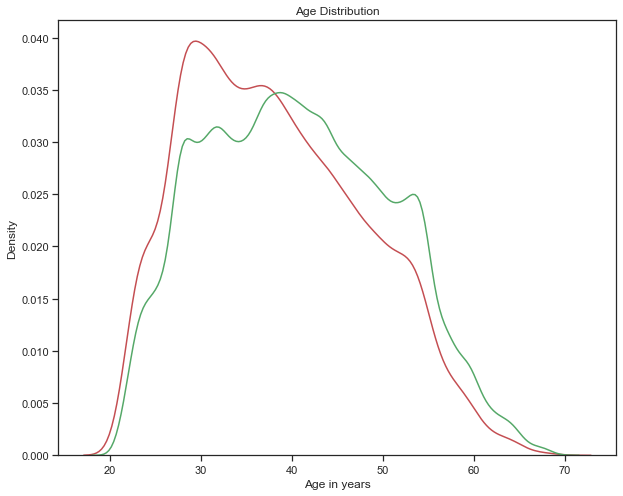

In [55]:
import plotly.figure_factory as ff
age_target1 = app_data.loc[app_data["TARGET"] == 1,"AGE"]
age_target0 = app_data.loc[app_data["TARGET"] == 0,"AGE"]
plt.figure(figsize = (10, 8))
sns.kdeplot(age_target1, label = "Defaulter",color= 'r')
sns.kdeplot(age_target0, label = "Repayer", color= 'g')
plt.xlabel('Age in years'); 
plt.ylabel('Density'); 
plt.title('Age Distribution');

In [56]:
app_data['AGE'].corr(app_data['TARGET'])

-0.06575553861621596

- Correlation is less significant, So it doesn't affect the target

In [57]:
# Age graph
bins = [0,20,25,30,35,40,45,50,55,60,100]
slot = ["0-20","20-25","25-30","30-35","35-40","40-45","45-50","50-55","55-60","60 Above"]
app_data["AGE_RANGE"]= pd.cut(app_data['AGE'],bins=bins,labels=slot)
fig = px.bar(
    pd.DataFrame(round((app_data['AGE_RANGE'].value_counts(normalize=True)*100),3)),
    y= 'AGE_RANGE',
    x= (pd.DataFrame(round((app_data['AGE_RANGE'].value_counts(normalize=True)*100),3))).index,
    title= 'AGE',
    labels={
        "AGE_RANGE": "Percentage"
    }
)
print(round((app_data['AGE_RANGE'].value_counts(normalize=True,sort=False)*100),3))
fig.show()

0-20         0.000
20-25        4.809
25-30       12.993
30-35       15.579
35-40       16.866
40-45       16.169
45-50       13.465
50-55       12.149
55-60        5.591
60 Above     2.380
Name: AGE_RANGE, dtype: float64


In [58]:
# # Employee time graph
# bins = [0,5,10,15,20,25,30,50]
# slot = ["0-5","5-10","10-15","15-20","20-25","25-30","30 Above"]
# app_data_bar = pd.DataFrame()
# app_data_bar['YEARS_EMPLOYED']= pd.cut(app_data['YEARS_EMPLOYED'],bins=bins,labels=slot)
# fig = px.bar(
#     pd.DataFrame(round((app_data_bar['YEARS_EMPLOYED'].value_counts(normalize=True)*100),3)),
#     y= 'YEARS_EMPLOYED',
#     x= (pd.DataFrame(round((app_data_bar['YEARS_EMPLOYED'].value_counts(normalize=True)*100),3))).index,
#     title= "YEARS_EMPLOYED",
#     labels={
#         "YEARS_EMPLOYED" : "Percentage"
#     }
# )
# print(round((app_data_bar['YEARS_EMPLOYED'].value_counts(normalize=True,sort=False)*100),3))
# fig.show()

In [59]:
# We can see values of columns AMT_INCOME_TOTAL, AMT_CREDIT, AMT_ANNUITY, AMT_GOODS_PRICE are big. So we need to standardize these columns by dividing with 1lakh
amt_col = ['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE']
app_data[amt_col] = app_data[amt_col]/100000

In [60]:
# Lets visualize these columns
amt_col = ['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_GOODS_PRICE']

In [61]:
bins = [0,1,2,3,4,5,6,7,8,9,10,100]
slot = ['0-1L','1L-2L', '2L-3L','3L-4L','4L-5L','5L-6L','6L-7L','7L-8L','8L-9L','9L-10L','10L Above']
for col in amt_col:
    app_data[col+"_RANGE"]= pd.cut(app_data[col],bins=bins,labels=slot)
    fig = px.pie(
        pd.DataFrame(round((app_data[col+"_RANGE"].value_counts(normalize=True,sort= False)*100),3)),
        values= col+"_RANGE",
        names= (pd.DataFrame(round((app_data[col+"_RANGE"].value_counts(normalize=True,sort= False)*100),3))).index,
        title= col
    )
    print(round((app_data[col+"_RANGE"].value_counts(normalize=True)*100),3),"\n\n")
    fig.show()
    print("\n")

1L-2L        51.504
2L-3L        22.889
0-1L         17.321
3L-4L         5.330
4L-5L         1.950
5L-6L         0.407
6L-7L         0.324
8L-9L         0.113
10L Above     0.094
7L-8L         0.059
9L-10L        0.011
Name: AMT_INCOME_TOTAL_RANGE, dtype: float64 






10L Above    17.111
2L-3L        16.841
5L-6L        11.075
4L-5L        10.751
1L-2L         9.559
3L-4L         8.680
6L-7L         7.818
8L-9L         7.353
7L-8L         6.115
9L-10L        3.004
0-1L          1.693
Name: AMT_CREDIT_RANGE, dtype: float64 






2L-3L        19.641
4L-5L        18.980
6L-7L        12.839
10L Above    11.574
1L-2L        10.433
8L-9L         7.621
3L-4L         6.948
5L-6L         4.116
7L-8L         2.739
9L-10L        2.573
0-1L          2.535
Name: AMT_GOODS_PRICE_RANGE, dtype: float64 




### 2.2.6 Handling Outliers

From describe we can see that there are a lot of columns those who have high difference between Max and 75 percentile and some have high max values. So those columns are:
    `CNT_CHILDREN`, `AMT_INCOME_TOTAL`, `AMT_CREDIT`, `AMT_ANNUITY`, `AMT_GOODS_PRICE`, `DAYS_BIRTH`, `DAYS_EMPLOYED`, `DAYS_REGISTRATION`

In [62]:
app_data.describe()

,SK_ID_CURR,TARGET,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,OWN_CAR_AGE,FLAG_EMP_PHONE,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3
count,252137.000000,252137.000000,252137.000000,252137.000000,252137.000000,252137.000000,252137.000000,251881.000000,252137.000000,252137.000000,252137.000000,252137.000000,252137.000000,94413.000000,252137.000000,252137.000000,252137.000000,252137.000000,252137.000000,252137.000000,252137.000000,252137.000000,121276.000000,2.516330e+05,202241.000000
mean,278114.643103,0.086600,0.678528,0.498515,1.759141,6.113985,0.278122,5.494057,0.020894,40.463379,6.531971,12.699811,7.672986,11.950187,0.999952,12.203302,0.017241,0.061919,0.049588,0.089769,0.281065,0.218988,0.481906,5.161387e-01,0.500341
std,102815.635309,0.281248,0.467042,0.763161,2.588516,4.065272,0.146474,3.732685,0.013874,10.034449,6.406466,8.910052,4.151673,11.981952,0.006899,3.299799,0.130167,0.241008,0.217093,0.285851,0.449520,0.413561,0.205495,1.899230e-01,0.196006
min,100002.000000,0.000000,0.000000,0.000000,0.256500,0.450000,0.019800,0.405000,0.000290,20.517808,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.014568,8.173617e-08,0.000527
25%,189035.000000,0.000000,0.000000,0.000000,1.125000,2.779695,0.170730,2.475000,0.010006,32.260274,2.101370,5.054795,4.073973,5.000000,1.000000,10.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.318983,3.982912e-01,0.357293
50%,278064.000000,0.000000,1.000000,0.000000,1.575000,5.212800,0.258345,4.500000,0.018850,39.926027,4.515068,11.684932,7.906849,9.000000,1.000000,12.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.480880,5.670569e-01,0.522697
75%,367165.000000,0.000000,1.000000,1.000000,2.115000,8.292240,0.356175,6.930000,0.028663,48.117808,8.698630,19.046575,11.443836,15.000000,1.000000,15.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.644963,6.638953e-01,0.657784
max,456255.000000,1.000000,1.000000,19.000000,1170.000000,40.500000,2.580255,40.500000,0.072508,69.041096,49.073973,62.816438,19.717808,91.000000,1.000000,23.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.944420,8.549997e-01,0.893976


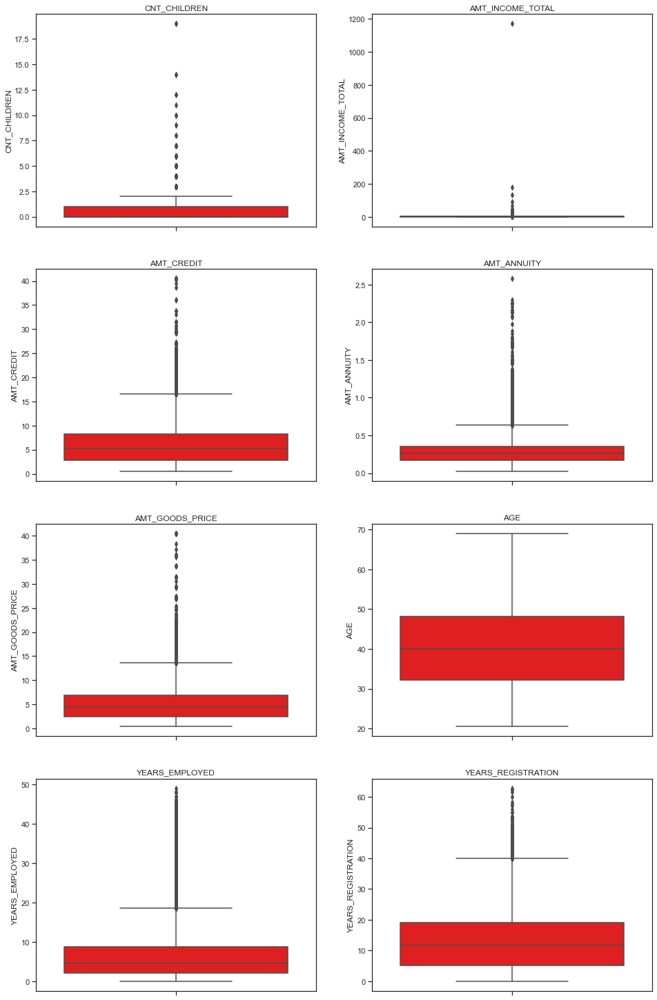

In [63]:
box_col = ["CNT_CHILDREN","AMT_INCOME_TOTAL", "AMT_CREDIT", "AMT_ANNUITY", "AMT_GOODS_PRICE", "AGE","YEARS_EMPLOYED", "YEARS_REGISTRATION"]
import itertools
plt.figure(figsize=[16,26])
for i,j in itertools.zip_longest(box_col,range(len(box_col))):
    plt.subplot(4,2,j+1)
    sns.boxplot( y = app_data[i], color="red")
    plt.title(i)

It can be seen that in current `app_data`

- `AMT_ANNUITY`, `AMT_CREDIT`, `AMT_GOODS_PRICE`, `CNT_CHILDREN` have some number of outliers but those are fine
- AGE has no outlier that means the data is legit
- `AMT_INCOME_TOTAL` has huge number of outliers which indicates that few of the loan applicants have high income compared to others
- `YEARS_EMPLOYED` use to have outlier value around 1000 years which is impossible and hence it has been removed automatically while dropping rows considering some differet factors.

In [64]:
app_data.shape

(252137, 39)

### 2.2.8 Summary

- There are `2,52,137` rows and `39` columns present in application_data.csv
- Worked with Null values and XNA values
- Dropped unwanted columns from FLAG data 
- Dropped other unwanted columns
- Worked with negative values and converted them to positive
- Standardized `DAYS_%` columns and `AMT_%` columns
- Removed Outlier which is not required

## 2.3 Categorical Analysis

1. Single Features
`CODE_GENDER`, `NAME_EDUCATION_TYPE`, `NAME_FAMILY_STATUS`, `NAME_INCOME_TYPE`, `OCCUPATION_TYPE`

Multiple features with Target feature
    
2. NAME_FAMILY_STATUS
3. NAME_INCOME_TYPE
4. NAME_EDUCATION_TYPE
5. ORGANIZATION_TYPE
6. OCCUPATION_TYPE
7. NAME_HOUSING_TYPE
8. FLAG_OWN_CAR
9. FLAG_OWN_REALTY
10. FLAG_CONTRACT_TYPE
11. CODE_GENDER
12. WEEKDAY_APPR_PROCESS_START
13. REG_REGION/ REG_CITY Features
14. Funtion for further analysis
15. Funtion for further analysis
16. ORGANIZATION_TYPE, color=CODE_GENDER
17. FLAG_OWN_CAR, color= CODE_GENDER
18. NAME_CONTRACT_TYPE, color = CODE_GENDER
19. AMT_INCOME_RANGE, color = CODE_GENDER
20. NAME_INCOME_TYPE, color = CODE_GENDER
21. AGE
22. CNT_CHILDREN
23. FLAG_EMP_PHONE
24. Segment Analysis

In [210]:
# Required Functions


def feature_plot(col,count=0):
    temp = app_data[col].value_counts()
    df = pd.DataFrame({col:temp.index, "Count":temp.values})
    
    df_perecentage = app_data[[col,"TARGET"]].groupby([col],as_index=False).mean()
    df_perecentage.sort_values(by="TARGET", ascending=False, inplace=True)
    
    if count == 1:
        fig = make_subplots(rows=2, cols=1, shared_xaxes=False,  subplot_titles=('Absolute Value',"% of Defaulter - " + col))
        fig.add_trace(go.Bar(name="Count" ,x= df[col], y= df["Count"],),row=1,col=1)
        fig.add_trace(go.Bar(name="% of Defaulter" , x= df_perecentage[col], y= df_perecentage['TARGET']*100),row=2,col=1)
        fig.update_layout(height=1000, width=1200, title={
            'text':col, 
            'y':0.96,
            'x':0.48,
            'xanchor': 'center'})
        fig.show()
    else:
        fig = make_subplots(rows=1, cols=2, shared_xaxes=False,  subplot_titles=('Absolute Value',"% of Defaulter - " + col))
        fig.add_trace(go.Bar(name="Count" ,x= df[col], y= df["Count"],),row=1,col=1)
        fig.add_trace(go.Bar(name="% of Defaulter", x= df_perecentage[col], y= df_perecentage['TARGET']*100),row=1,col=2)
        fig.update_layout(height=600, width=1200, title={
            'text':col, 
            'y':0.92,
            'x':0.5,
            'xanchor': 'center'})
        fig.show()

### 2.3.1 Single Features

- But by just analysing single variable we will not find insights related to the defaulter, as here we are getting idea of counts for each category. So we need to write code to visualize the relation between each category of each feature with the `TARGET` feature.

External source feature analysis

- EXT_SOURCE_1 is positively correlated with Client's age. So we will keep this feature.
- We will do segment analysis for these features for more confirmation.

In [66]:
Features = list(app_data.columns)
unique_values_table = number_of_unique_values(app_data,Features)
unique_values_table[unique_values_table['Count_Unique_values'] < 60]

,Features,Count_Unique_values,Unique_values,Missing_values_count,Data_type
0,LIVE_CITY_NOT_WORK_CITY,2,"[0, 1]",0,int64
1,REG_CITY_NOT_WORK_CITY,2,"[0, 1]",0,int64
2,FLAG_EMP_PHONE,2,"[1, 0]",0,int64
3,REG_REGION_NOT_WORK_REGION,2,"[0, 1]",0,int64
4,LIVE_REGION_NOT_WORK_REGION,2,"[0, 1]",0,int64
5,REG_CITY_NOT_LIVE_CITY,2,"[0, 1]",0,int64
6,REG_REGION_NOT_LIVE_REGION,2,"[0, 1]",0,int64
7,FLAG_OWN_CAR,2,"[N, Y]",0,object
8,CODE_GENDER,2,"[M, F]",0,object
9,NAME_CONTRACT_TYPE,2,"[Cash loans, Revolving loans]",0,object


We will visualize these categories one by one

`CODE_GENDER`, `NAME_EDUCATION_TYPE`, `NAME_FAMILY_STATUS`, `NAME_INCOME_TYPE`, `OCCUPATION_TYPE`

In [67]:
viz = ['CODE_GENDER', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_INCOME_TYPE', 'OCCUPATION_TYPE']
for col in viz:
    temp = app_data[col].value_counts()
    df = pd.DataFrame({col:temp.index, "Count":temp.values})
    fig = px.bar(
        data_frame=df,
        x= col,
        y= "Count",
        height= 400,
        width= 500
    )
    fig.show()
    print("\n")
 

In [68]:
ext_feature = app_data[['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', "TARGET", "AGE"]]
ext_feature_corr = ext_feature.corr()

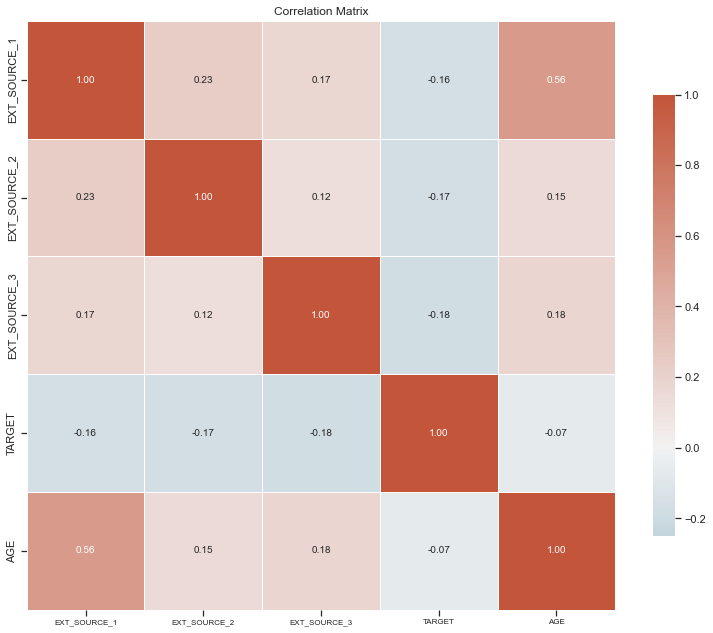

In [69]:
# sns.set_theme(style="white")
mask = np.triu(np.ones_like(ext_feature_corr, dtype=bool))
# Set up the matplotlib figure

f, ax = plt.subplots(figsize=(11, 9))
# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, n=256, as_cmap=True)
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(ext_feature_corr, 
            #mask=mask, 
            cmap=cmap, 
            vmax=1, 
            vmin = -.25,
            center=0,
            square=True, 
            linewidths=.5,
            annot = True,
            fmt='.2f', 
            annot_kws={'size': 10},
            cbar_kws={"shrink": .75})
plt.title('Correlation Matrix')
plt.tight_layout()
ax.tick_params(axis = 'x', labelsize = 8)

plt.show()


### 2.3.2 NAME_FAMILY_STATUS

- Result: Most clients are married 
- `Civil marraiges (10.43%)` and `single people (10.47%)` have higher chance of deafulter than others.

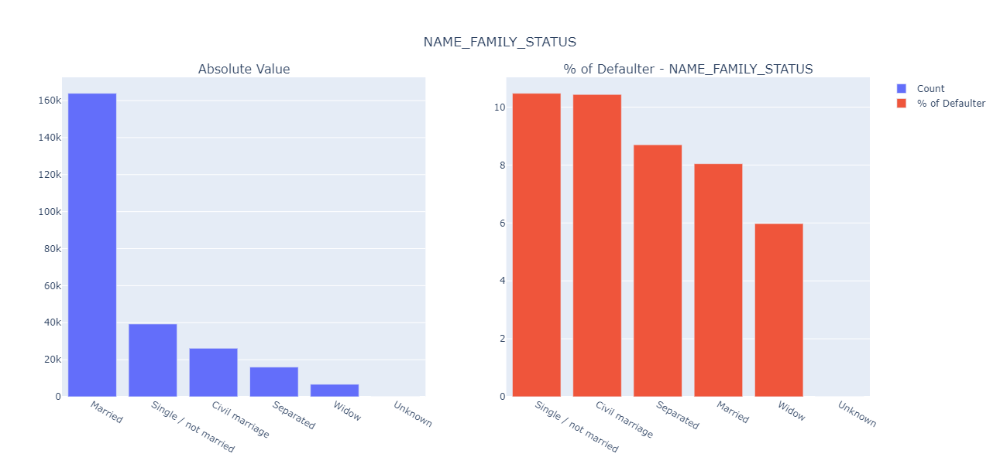

In [212]:
feature_plot("NAME_FAMILY_STATUS")

### 2.3.3. NAME_INCOME_TYPE

- Working class people are the loan takers
- Unemployed or Maternity leave cliets have very high defaulters even though they are minority compared to other income types
- Rest are fine

In [71]:
app_data['NAME_INCOME_TYPE'].value_counts()

Working                 158774
Commercial associate     71617
State servant            21703
Student                     18
Pensioner                   10
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64

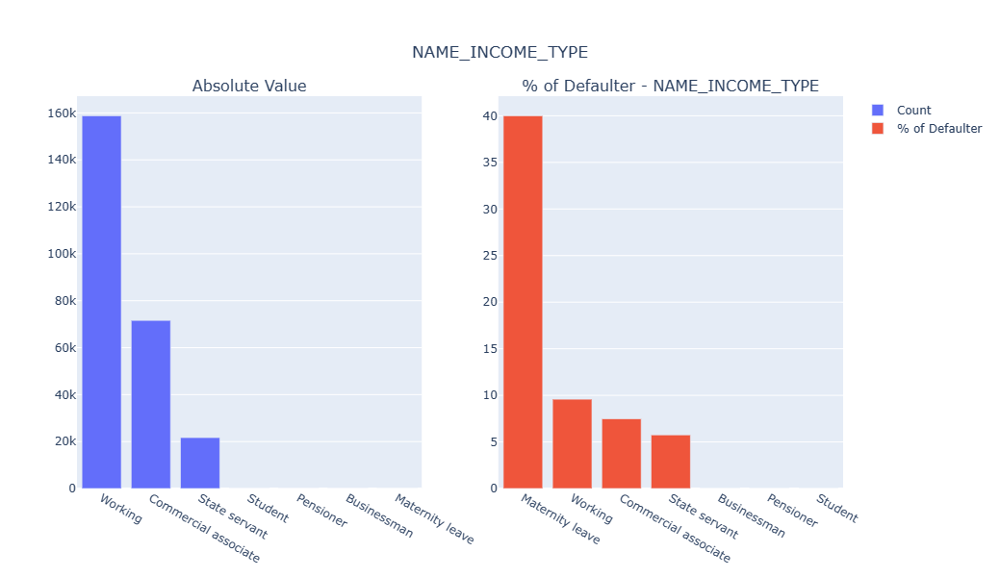

In [213]:
feature_plot('NAME_INCOME_TYPE')

### 2.3.4 NAME_EDUCATION_TYPE

- Clients with `Secondary and Higher Education` took more loan.
- Clients with Lower secondary education has higher percentage of Defaulters even though they are minority compared to other Eductional level loan takers.
- Hence, `Lower secondary` edu clients are risky for the company.

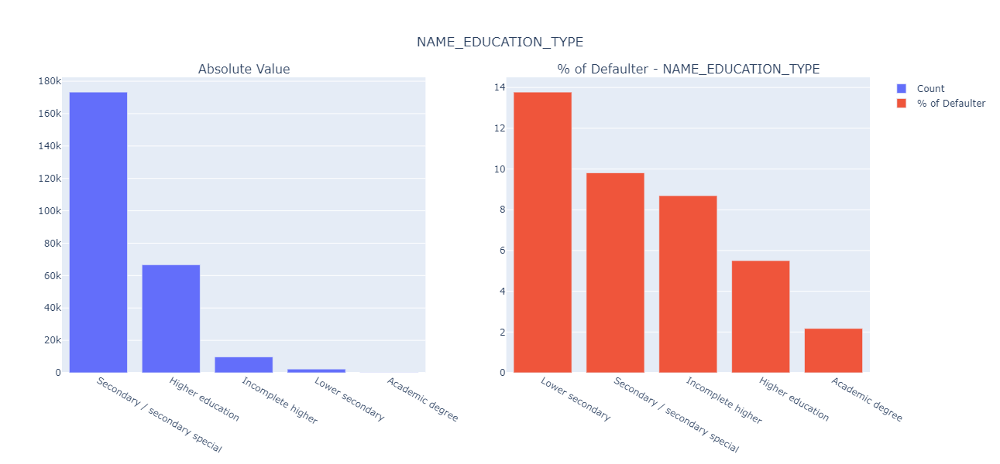

In [214]:
feature_plot('NAME_EDUCATION_TYPE')

### 2.3.5 ORGANIZATION_TYPE

- Organizations with highest percentage of loan defaulters are `Transport Type 3 (15.75%)`, `Industry Type 13 (13.43%)`, `Industry Type 8 (12.5%)`
- Most loan takers are `Business Entity Type 3`  and `Self-employed`

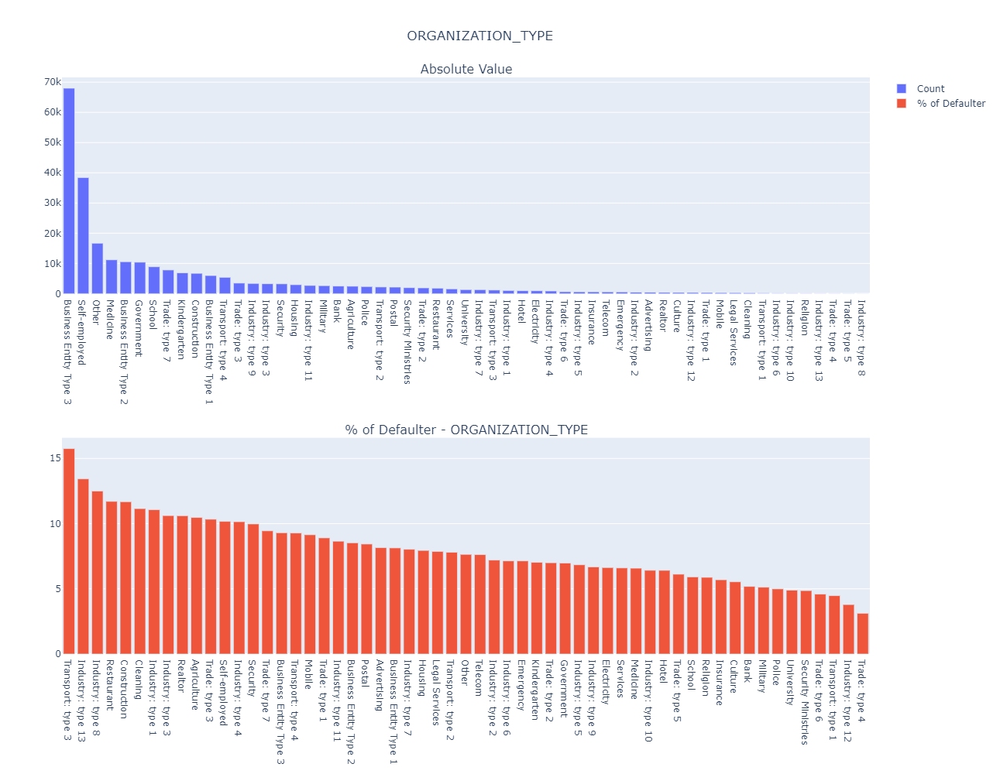

In [215]:
feature_plot('ORGANIZATION_TYPE',1)

### 2.3.6 OCCUPATION_TYPE

- `Low-skill Laborers (17%)`, `Drivers(11%)`, `Waiters/barmen staff(11.27%)`, `Security staff(10.74%)` etc. are the defaulters.
- Hence, Clients with less income range are more likly to be a loan defaulters than high income range clients.
- So, Occupation_type and Defaulters are inversly propotional to each other.

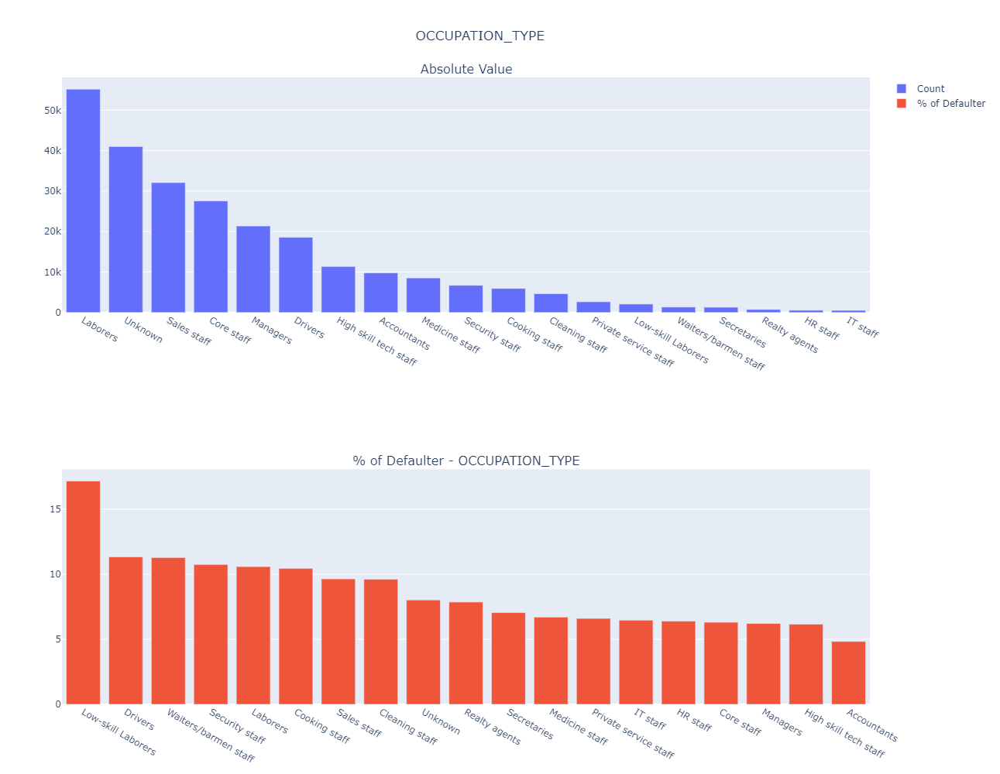

In [216]:
feature_plot('OCCUPATION_TYPE',1)

### 2.3.7 NAME_HOUSING_TYPE

- Majority applicant have House/apartment type housing with around 8.3% default rate.
- Most defaulter clients are from `rented apartment (12.5%)` and with `parents(11.79%)`

In [76]:
feature_plot("NAME_HOUSING_TYPE")

### 2.3.8 FLAG_OWN_CAR

- Clients with car are trustability on loan payments because we can see clients who owns car are more likely to repay the loan.
- We can say clients without car are more likly to not repay the loan

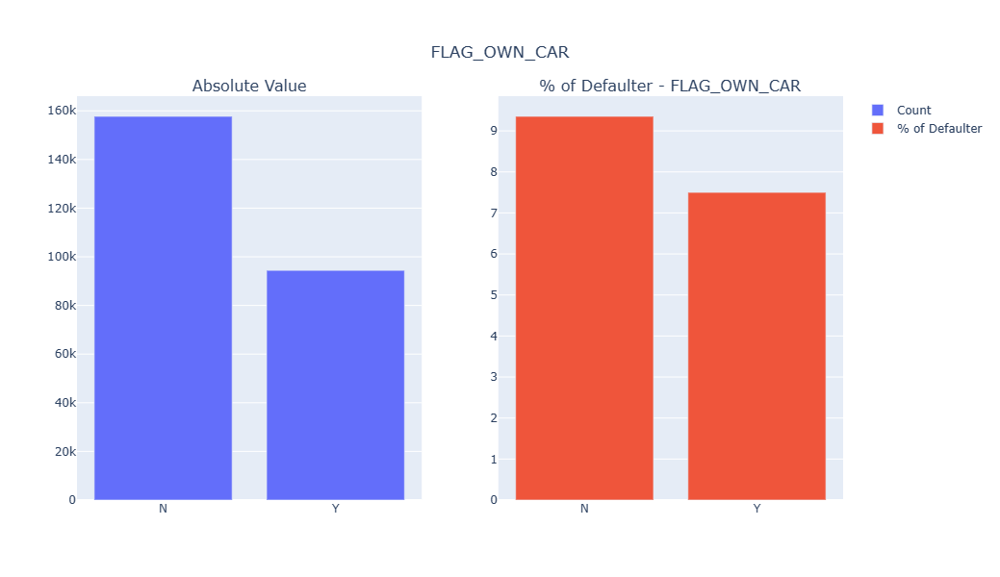

In [211]:
feature_plot("FLAG_OWN_CAR")

### 2.3.9 FLAG_OWN_REALTY

- Clients without real estate are nearly half of clients with real estate.
- where as both categories have moslty same percentage of defaulters.
- So, Its hard to get insights from this, lets skip this 

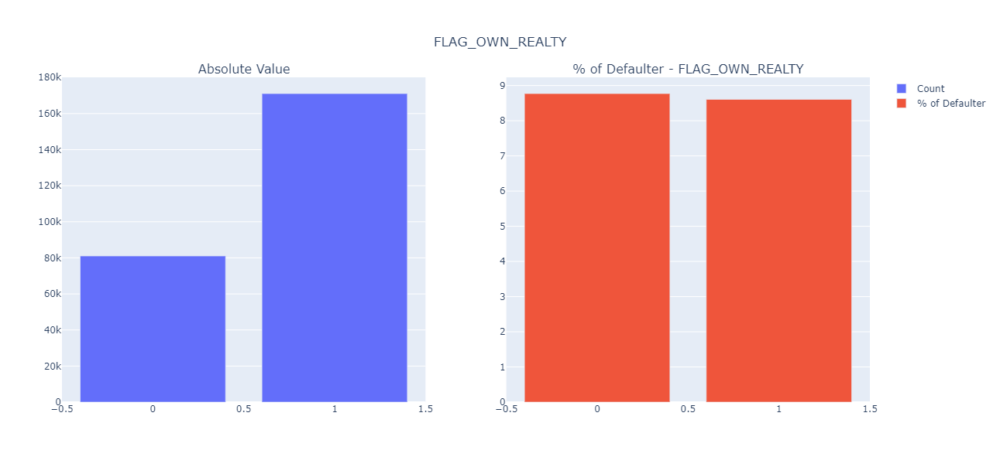

In [217]:
feature_plot("FLAG_OWN_REALTY")

### 2.3.10 FLAG_CONTRACT_TYPE

- Most clients took cash loans.
- Most cash loans are takers are defaulters compared to revolving loans.

In [79]:
feature_plot("NAME_CONTRACT_TYPE")

### 2.3.11 CODE_GENDER

- Number of female applicants are nearly twice the number of male applicants.
- Moslty males are defaulters even though female applicants are double of male applicants

In [80]:
feature_plot("CODE_GENDER")

### 2.3.12 WEEKDAY_APPR_PROCESS_START

- No insight for defaulters here

In [81]:
feature_plot("WEEKDAY_APPR_PROCESS_START")

### 2.3.13 REG_REGION/ REG_CITY Features

- `REG_REGION_NOT_LIVE_REGION`: Flag if client's permanent address does not match contact address (1=different, 0=same, at region level)	
- `REG_REGION_NOT_WORK_REGION`: Flag if client's permanent address does not match work address (1=different, 0=same, at region level)	
- `REG_CITY_NOT_LIVE_CITY`: Flag if client's permanent address does not match work address (1=different, 0=same, at region level)	
- `REG_CITY_NOT_WORK_CITY`: Flag if client's permanent address does not match work address (1=different, 0=same, at city level)	

    - Clients who's permanent addresses do not match contact and work address are rare and more likely to default, hence less reliable
    - We see the same people are risky here at city level like we saw in the regional level.
    - As city level has a significant difference in defaulter rates, we don't have to consider regional level as a determining factor.

In [82]:
reg = ['REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY']

for col in reg:
    feature_plot(col)
    print('\n')

In [83]:
app_data.shape

(252137, 39)

### 2.3.14 Funtion for further analysis

In [84]:

def feature_plot_2(col, hue, horizontal=0,log=0):
    if log == 1:
        if horizontal == 1:
            # Target 1
            temp = app_data_target1.groupby(col)[hue].value_counts().reset_index(name="Logarithmic Value").sort_values(by="Logarithmic Value", ascending=False)
            df = pd.DataFrame(temp)
            df["Logarithmic Value"] = np.log(df["Logarithmic Value"])
            fig = px.bar(data_frame=df, y=col, x="Logarithmic Value", barmode="group", color= hue, title="Distribution of "+col+" - Target 1", orientation='h', height=1200 )
            fig.show()

            print("\n")

            # Target 0
            temp = app_data_target0.groupby(col)[hue].value_counts().reset_index(name="Logarithmic Value").sort_values(by="Logarithmic Value", ascending=False)
            df = pd.DataFrame(temp)
            df["Logarithmic Value"] = np.log(df["Logarithmic Value"])
            fig = px.bar(data_frame=df, y=col, x="Logarithmic Value", barmode="group", color= hue, title="Distribution of "+col+" - Target 0", orientation='h',height=1200)
            fig.show()
        else:
             # Target 1
            temp = app_data_target1.groupby(col)[hue].value_counts().reset_index(name="Logarithmic Value").sort_values(by="Logarithmic Value", ascending=False)
            df = pd.DataFrame(temp)
            df["Logarithmic Value"] = np.log(df["Logarithmic Value"])
            fig = px.bar(data_frame=df, x=col, y="Logarithmic Value", barmode="group", color= hue, title="Distribution of "+col+" - Target 1", height= 600)
            fig.show()

            print("\n")

            # Target 0
            temp = app_data_target0.groupby(col)[hue].value_counts().reset_index(name="Logarithmic Value").sort_values(by="Logarithmic Value", ascending=False)
            df = pd.DataFrame(temp)
            df["Logarithmic Value"] = np.log(df["Logarithmic Value"])
            fig = px.bar(data_frame=df, x=col, y="Logarithmic Value", barmode="group", color= hue, title="Distribution of "+col+" - Target 0", height= 600 )
            fig.show()
    else:
        if horizontal == 1:
            # Target 1
            temp = app_data_target1.groupby(col)[hue].value_counts().reset_index(name="Counts").sort_values(by="Counts", ascending=False)
            df = pd.DataFrame(temp)
            fig = px.bar(data_frame=df, y=col, x="Counts", barmode="group", color= hue, title="Distribution of "+col+" - Target 1", orientation='h', height=1200 )
            fig.show()

            print("\n")

            # Target 0
            temp = app_data_target0.groupby(col)[hue].value_counts().reset_index(name="Counts").sort_values(by="Counts", ascending=False)
            df = pd.DataFrame(temp)
            fig = px.bar(data_frame=df, y=col, x="Counts", barmode="group", color= hue, title="Distribution of "+col+" - Target 0", orientation='h',height=1200)
            fig.show()
        else:
             # Target 1
            temp = app_data_target1.groupby(col)[hue].value_counts().reset_index(name="Counts").sort_values(by="Counts", ascending=False)
            df = pd.DataFrame(temp)
            fig = px.bar(data_frame=df, x=col, y="Counts", barmode="group", color= hue, title="Distribution of "+col+" - Target 1", height= 600)
            fig.show()

            print("\n")

            # Target 0
            temp = app_data_target0.groupby(col)[hue].value_counts().reset_index(name="Counts").sort_values(by="Counts", ascending=False)
            df = pd.DataFrame(temp)
            fig = px.bar(data_frame=df, x=col, y="Counts", barmode="group", color= hue, title="Distribution of "+col+" - Target 0", height= 600 )
            fig.show()
        



In [85]:
numerical_features = ['TARGET','CNT_CHILDREN','AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','REGION_POPULATION_RELATIVE','AGE', 
                      'YEARS_EMPLOYED','YEARS_REGISTRATION','YEARS_ID_PUBLISH','HOUR_APPR_PROCESS_START','LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 
                      'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY']
app_data[numerical_features] = app_data[numerical_features].apply(pd.to_numeric)
app_data.head()


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,OWN_CAR_AGE,FLAG_EMP_PHONE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,AGE_RANGE,AMT_INCOME_TOTAL_RANGE,AMT_CREDIT_RANGE,AMT_GOODS_PRICE_RANGE
0,100002,1,Cash loans,M,N,1,0,2.025,4.065975,0.247005,3.510,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,25.920548,1.745205,9.994521,5.808219,NaN,1,Laborers,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,25-30,2L-3L,4L-5L,3L-4L
1,100003,0,Cash loans,F,N,0,0,2.700,12.935025,0.356985,11.295,State servant,Higher education,Married,House / apartment,0.003541,45.931507,3.254795,3.249315,0.797260,NaN,1,Core staff,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,45-50,2L-3L,10L Above,10L Above
2,100004,0,Revolving loans,M,Y,1,0,0.675,1.350000,0.067500,1.350,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,52.180822,0.616438,11.671233,6.934247,26.0,1,Laborers,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,50-55,0-1L,1L-2L,1L-2L
3,100006,0,Cash loans,F,N,1,0,1.350,3.126825,0.296865,2.970,Working,Secondary / secondary special,Civil marriage,House / apartment,0.008019,52.068493,8.326027,26.939726,6.676712,NaN,1,Laborers,WEDNESDAY,17,0,0,0,0,0,0,Business Entity Type 3,NaN,0.650442,NaN,50-55,1L-2L,3L-4L,2L-3L
4,100007,0,Cash loans,M,N,1,0,1.215,5.130000,0.218655,5.130,Working,Secondary / secondary special,Single / not married,House / apartment,0.028663,54.608219,8.323288,11.810959,9.473973,NaN,1,Core staff,THURSDAY,11,0,0,0,0,1,1,Religion,NaN,0.322738,NaN,50-55,1L-2L,5L-6L,5L-6L


Divide the data set into two datasets of `target = 1` and `target = 0`

In [86]:
app_data_target1 = app_data.loc[app_data["TARGET"]==1]
app_data_target0 = app_data.loc[app_data["TARGET"]==0]
print("app_data_target0 Shape: ",app_data_target0.shape)
print("app_data_target1 Shape: ",app_data_target1.shape)

app_data_target0 Shape:  (230302, 39)
app_data_target1 Shape:  (21835, 39)


### 2.3.15 OCCUPATION_TYPE, color=CODE_GENDER

- Females with occupation type: `Accountants`, `Managers`, `core staff`, `HR staff` etc professions are the most defaulters as compared to their counterpart male.
- Males with occupation type: `Realty agent`, `Low skilled labours` etc professions are the most defaulters as compared to their counterpart female.

In [87]:
feature_plot_2("OCCUPATION_TYPE", "CODE_GENDER",0,1)

In [88]:
heatmap_occ_gender = pd.pivot_table(data=app_data, index="OCCUPATION_TYPE", columns="CODE_GENDER", values='TARGET')

fig = px.imshow(heatmap_occ_gender,height=800)
fig.layout.height = 500
fig.layout.width = 500
fig.show()

### 2.3.16 ORGANIZATION_TYPE, color=CODE_GENDER

- Most loan takers are : Business entity Type 3’ , ‘Self employed’ , ‘Other’ , ‘Medicine’ and ‘Government’.

In [89]:
feature_plot_2("ORGANIZATION_TYPE", "CODE_GENDER",1,1)

### 2.3.17 FLAG_OWN_CAR, color= CODE_GENDER

- According to heatmap, Male clietns without car are the one's with highest default rate compared to 3 sub categories.
- But according to bar plot we have female clients more than male clients with highest default rate.
- So, result is female clients without car are the most defaulters compared to male clients without car.

In [90]:
feature_plot_2("FLAG_OWN_CAR","CODE_GENDER")

In [91]:
heatmap = pd.pivot_table(data=app_data, index="FLAG_OWN_CAR", columns="CODE_GENDER", values='TARGET')

fig = px.imshow(heatmap,height=800)
fig.layout.height = 500
fig.layout.width = 500
fig.show()

### 2.3.18 NAME_CONTRACT_TYPE, color = CODE_GENDER

- Higher number of cash loans than revolving loans
-  As per the heatmap, Male candidates with cash loans are the one's with highest default rate as compared to other 3 sub categories, but analyzing alongwith the bar plot, it's clear that both males/females having cash loans have almost equal ratio in defaulting, but looking at the revolving loans, even though the numbers are less, but the females who have taken revolving loans are the highest defaulters as compared to their male counter parts.

In [92]:
feature_plot_2('NAME_CONTRACT_TYPE','CODE_GENDER')

In [93]:
heatmap = pd.pivot_table(data=app_data, index="NAME_CONTRACT_TYPE", columns="CODE_GENDER", values='TARGET')

fig = px.imshow(heatmap,height=800)
fig.layout.height = 500
fig.layout.width = 500
fig.show()

### 2.3.19 AMT_INCOME_RANGE, color = CODE_GENDER

- Male clients with less income range are the most defaulters
- Default rate keeps decreasing as the income range increases

In [94]:
feature_plot_2("AMT_INCOME_TOTAL_RANGE","CODE_GENDER",0,1)

In [95]:
heatmap = pd.pivot_table(data=app_data, index="AMT_INCOME_TOTAL_RANGE", columns="CODE_GENDER", values='TARGET')

fig = px.imshow(heatmap,height=800)
fig.layout.height = 500
fig.layout.width = 500
fig.show()

### 2.3.20 NAME_INCOME_TYPE, color = CODE_GENDER

- In heat map we can see people with maternity leave are defaulters
- But Female loan takers are more so if we will see carefully both the graphs we will get the below conclusion
- Females are having marginally higher default rate as compared to males, and most defaulters are working professionals, commercial associates, state servants etc.

In [96]:
feature_plot_2("NAME_INCOME_TYPE","CODE_GENDER",0,1)

In [97]:
heatmap = pd.pivot_table(data=app_data, index="NAME_INCOME_TYPE", columns="CODE_GENDER", values='TARGET')

fig = px.imshow(heatmap,height=800)
fig.layout.height = 500
fig.layout.width = 500
fig.show()

### 2.3.21 AGE

- We can see you people have 12.2% default rate while oldest have only 4%
- We need to educate young people about financial management to reduce default rate

In [98]:
age_data = app_data[["TARGET","AGE","AGE_RANGE"]]
age_data = age_data.groupby("AGE_RANGE").mean()
age_data = age_data.drop('0-20',axis=0)
age_data

,TARGET,AGE
AGE_RANGE,,
20-25,0.122722,23.377690
25-30,0.111447,27.823198
30-35,0.102594,32.478715
35-40,0.089336,37.552277
40-45,0.078174,42.454862
45-50,0.073991,47.453676
50-55,0.067840,52.541347
55-60,0.058527,57.245062
60 Above,0.044159,62.738369


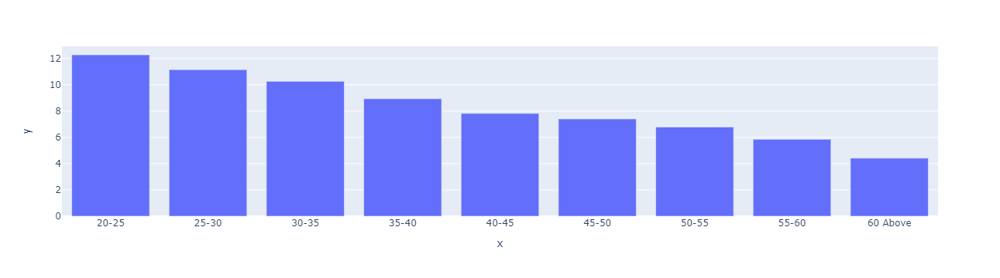

In [219]:
fig = px.bar(x = age_data.index, y = age_data['TARGET']*100, width=300)
fig.show()

### 2.3.22 CNT_CHILDREN

- Clients with high number of children are risky
- Most of the clients have no or very few children and are likely to repay loan on time

In [100]:
feature_plot("CNT_CHILDREN")

### 2.3.23 FLAG_EMP_PHONE

- It seems clients who are providing employee phone numbers are likely to be defaulter.

In [101]:
feature_plot("FLAG_EMP_PHONE")

### 2.3.24 Segment Analysis

- we will do segment analysis of following columns: `AMT_ANNUITY`, `AMT_INCOME_TOTAL`, `AMT_CREDIT`, `AMT_GOODS_PRCIE`, `AGE`, `YEARS_EMPLOYED`, `YEARS_REGISTRATION`, `YEARS_ID_PUBLISH`
- AMT_CREDIT around 5L clients are mostly defaulter.
- People with age less than 28 are mostly defaulters.
- Clients who are employed recently are mostly defualters.
- When clients change their registration closer to application date, they are more likely to defualt.
- EXT_SOURCE_3 showing a major difference between Defaulter and repayer so it 

In [102]:
segment_col = ['AMT_INCOME_TOTAL','AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'AGE', 'YEARS_EMPLOYED', 'YEARS_REGISTRATION', 'YEARS_ID_PUBLISH', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']

# Funtion for segment analysis


def segment_analysis(col):
    
    group_labels = ['Defaulter','Repayer']
    x1 = app_data_target1[col].dropna()
    x2 = app_data_target0[col].dropna()
    data = [x1, x2]
    fig = ff.create_distplot(hist_data=data, group_labels=group_labels, bin_size=.2, show_rug=False, curve_type='kde', show_hist=False)
    fig.update_layout(width=800, 
                      height=500,
                      bargap=0.1, xaxis_title = col, yaxis_title = "kernel density Estimate")
    fig.show()

In [103]:
# for loop for segment_col visualization

for feature in segment_col:
    segment_analysis(feature)
    print("\n")

# 3. DATA SET: "previous_application_data.csv"

## 3.1 Data Understanding

1. How many rows and columns are there?
2. Descriptive view and Datatype of features
3. Zero and missing values present in Data
4. Summary of Data Understanding

In [104]:
# content of the data
prev_app_data.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


### 3.1.1 How many rows and columns are there?

In [105]:
print("This data has ",prev_app_data.shape[0]," rows and ",prev_app_data.shape[1]," columns.")

This data has  1670214  rows and  37  columns.


In [106]:
len(set(prev_app_data['SK_ID_CURR']))
# We can see there are many applicants have applied for multiple loans in the past

338857

### 3.1.2 Descriptive view and Datatype of features

In [107]:
print(prev_app_data.describe())

         SK_ID_PREV    SK_ID_CURR   AMT_ANNUITY  AMT_APPLICATION  \
count  1.670214e+06  1.670214e+06  1.297979e+06     1.670214e+06   
mean   1.923089e+06  2.783572e+05  1.595512e+04     1.752339e+05   
std    5.325980e+05  1.028148e+05  1.478214e+04     2.927798e+05   
min    1.000001e+06  1.000010e+05  0.000000e+00     0.000000e+00   
25%    1.461857e+06  1.893290e+05  6.321780e+03     1.872000e+04   
50%    1.923110e+06  2.787145e+05  1.125000e+04     7.104600e+04   
75%    2.384280e+06  3.675140e+05  2.065842e+04     1.803600e+05   
max    2.845382e+06  4.562550e+05  4.180581e+05     6.905160e+06   

         AMT_CREDIT  AMT_DOWN_PAYMENT  AMT_GOODS_PRICE  \
count  1.670213e+06      7.743700e+05     1.284699e+06   
mean   1.961140e+05      6.697402e+03     2.278473e+05   
std    3.185746e+05      2.092150e+04     3.153966e+05   
min    0.000000e+00     -9.000000e-01     0.000000e+00   
25%    2.416050e+04      0.000000e+00     5.084100e+04   
50%    8.054100e+04      1.638000e+03  

In [108]:
dtypes_prev_app_data = prev_app_data.dtypes
dtypes_prev_app_data

SK_ID_PREV                       int64
SK_ID_CURR                       int64
NAME_CONTRACT_TYPE              object
AMT_ANNUITY                    float64
AMT_APPLICATION                float64
AMT_CREDIT                     float64
AMT_DOWN_PAYMENT               float64
AMT_GOODS_PRICE                float64
WEEKDAY_APPR_PROCESS_START      object
HOUR_APPR_PROCESS_START          int64
FLAG_LAST_APPL_PER_CONTRACT     object
NFLAG_LAST_APPL_IN_DAY           int64
RATE_DOWN_PAYMENT              float64
RATE_INTEREST_PRIMARY          float64
RATE_INTEREST_PRIVILEGED       float64
NAME_CASH_LOAN_PURPOSE          object
NAME_CONTRACT_STATUS            object
DAYS_DECISION                    int64
NAME_PAYMENT_TYPE               object
CODE_REJECT_REASON              object
NAME_TYPE_SUITE                 object
NAME_CLIENT_TYPE                object
NAME_GOODS_CATEGORY             object
NAME_PORTFOLIO                  object
NAME_PRODUCT_TYPE               object
CHANNEL_TYPE             

Count of each datatype : 
object     16
float64    15
int64       6
dtype: int64 

Percentage of each datatype % :
object     43.24
float64    40.54
int64      16.22
dtype: float64 



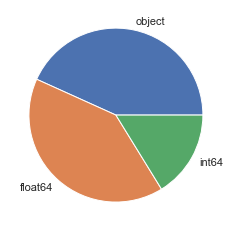

In [109]:
# Total count of each data type
print("Count of each datatype : ")
print(dtypes_prev_app_data.value_counts(),"\n")
print("Percentage of each datatype % :")
print((dtypes_prev_app_data.value_counts()/dtypes_prev_app_data.value_counts().sum()*100).round(2),'\n')
dtypes_prev_app_data.value_counts().plot.pie()
plt.xlabel("")
plt.ylabel("")
plt.show()

### 3.1.3 Zero and missing values present in Data

Call function to get <code>Zero Values</code> , <code>Missing Values</code> ,<code>% of Missing Values</code> ,<code>Total Zero and Missing Values</code> ,<code>% Total Zero and Missing Values</code> ,<code>Data Type</code> from the data

In [110]:
null_prev_app_table = missing_zero_values_table(prev_app_data)
null_prev_app_table

Your selected dataframe has 37 columns and 1670214 Rows.
There are 16 columns that have missing values.


,Zero Values,Missing Values,% of Missing Values,Total Zero and Missing Values,% Total Zero and Missing Values,Data Type
RATE_INTEREST_PRIMARY,0,1664263,99.64,1664263,99.64,float64
RATE_INTEREST_PRIVILEGED,0,1664263,99.64,1664263,99.64,float64
AMT_DOWN_PAYMENT,369854,895844,53.64,1265698,75.78,float64
RATE_DOWN_PAYMENT,369854,895844,53.64,1265698,75.78,float64
NAME_TYPE_SUITE,0,820405,49.12,820405,49.12,object
DAYS_FIRST_DRAWING,0,673065,40.30,673065,40.30,float64
DAYS_FIRST_DUE,0,673065,40.30,673065,40.30,float64
DAYS_LAST_DUE_1ST_VERSION,705,673065,40.30,673770,40.34,float64
DAYS_LAST_DUE,0,673065,40.30,673065,40.30,float64
DAYS_TERMINATION,0,673065,40.30,673065,40.30,float64


### 3.1.4 Unique values in Data set

In [111]:
prev_features = list(prev_app_data.columns)
unique_values_table = number_of_unique_values(prev_app_data,prev_features)
unique_values_table[unique_values_table["Count_Unique_values"] < 30]

,Features,Count_Unique_values,Unique_values,Missing_values_count,Data_type
0,NFLAG_LAST_APPL_IN_DAY,2,"[1, 0]",0,int64
1,FLAG_LAST_APPL_PER_CONTRACT,2,"[Y, N]",0,object
2,NFLAG_INSURED_ON_APPROVAL,3,"[0.0, 1.0, nan]",673065,float64
3,NAME_PRODUCT_TYPE,3,"[XNA, x-sell, walk-in]",0,object
4,NAME_CLIENT_TYPE,4,"[Repeater, New, Refreshed, XNA]",0,object
5,NAME_CONTRACT_STATUS,4,"[Approved, Refused, Canceled, Unused offer]",0,object
6,NAME_PAYMENT_TYPE,4,"[Cash through the bank, XNA, Non-cash from your account, Cashless from the account of the employer]",0,object
7,NAME_CONTRACT_TYPE,4,"[Consumer loans, Cash loans, Revolving loans, XNA]",0,object
8,NAME_YIELD_GROUP,5,"[middle, low_action, high, low_normal, XNA]",0,object
9,NAME_PORTFOLIO,5,"[POS, Cash, XNA, Cards, Cars]",0,object


### 3.1.5 Summary of Data Understanding

- There are `16,70,214` number of rows and `37` number of columns
- There are 3 types of datatypes available:
    - float64 : `15`
    - int64 : `6`
    - object/string : `16`
- There are negative values in some of columns.
- There are days and hour which are not in correct format.
- There are `16` columns that have missing values majority of them have more that `40%` missing values.

## 3.2 Data Manipulation

### 3.2.1 Drop columns with more than 40% null values and Drop unwanted columns

In [112]:
missing_value = null_prev_app_table[null_prev_app_table['% of Missing Values'] > 40]
missing_value_40_prev = missing_value['% of Missing Values']
missing_value_40_prev

RATE_INTEREST_PRIMARY        99.64
RATE_INTEREST_PRIVILEGED     99.64
AMT_DOWN_PAYMENT             53.64
RATE_DOWN_PAYMENT            53.64
NAME_TYPE_SUITE              49.12
DAYS_FIRST_DRAWING           40.30
DAYS_FIRST_DUE               40.30
DAYS_LAST_DUE_1ST_VERSION    40.30
DAYS_LAST_DUE                40.30
DAYS_TERMINATION             40.30
NFLAG_INSURED_ON_APPROVAL    40.30
Name: % of Missing Values, dtype: float64

In [113]:
# Dropping null columns having missing values more than 50%
prev_app_data = prev_app_data.drop(columns=missing_value_40_prev.index)

In [114]:
prev_app_data.shape

(1670214, 26)

### 3.2.2 Drop rows of `NAME_CASH_LOAN_PURPOSE` which has values like `XNA`, `XAP`

In [115]:
prev_app_data = prev_app_data.drop(prev_app_data[prev_app_data['NAME_CASH_LOAN_PURPOSE'] == "XNA"].index)
prev_app_data = prev_app_data.drop(prev_app_data[prev_app_data['NAME_CASH_LOAN_PURPOSE'] == "XAP"].index)
prev_app_data.shape

(69635, 26)

## 3.3 Categorical Analysis

1. NAME_PORTFOLIO, NAME_PRODUCT_TYPE, NAME_PAYMENT_TYPE, NAME_YIELD_GROUP, CODE_REJECT_REASON
2. NAME_CONTRACT_STATUS
3. CHANNEL_TYPE
4. NAME_CASH_LOAN_PURPOSE

In [116]:
prev_app_data.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'DAYS_DECISION',
       'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

In [117]:
prev_app_data.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,337500.0,THURSDAY,9,Y,1,Repairs,Refused,-781,Cash through the bank,HC,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high
5,1383531,199383,Cash loans,23703.930,315000.0,340573.5,315000.0,SATURDAY,8,Y,1,Everyday expenses,Approved,-684,Cash through the bank,XAP,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,18.0,low_normal,Cash X-Sell: low
19,1173070,199178,Cash loans,4666.500,45000.0,49455.0,45000.0,SATURDAY,16,Y,1,Everyday expenses,Refused,-584,XNA,HC,Repeater,XNA,Cash,walk-in,AP+ (Cash loan),6,XNA,18.0,high,Cash Street: high
51,2664403,163660,Cash loans,9804.285,67500.0,82611.0,67500.0,SATURDAY,10,Y,1,Car repairs,Approved,-766,Cash through the bank,XAP,New,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,12.0,high,Cash Street: high
85,1981960,306707,Cash loans,10678.005,225000.0,269550.0,225000.0,WEDNESDAY,11,Y,1,Building a house or an annex,Refused,-13,Cash through the bank,SCOFR,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,36.0,low_normal,Cash Street: low


### 3.3.1 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'NAME_PAYMENT_TYPE', 'NAME_YIELD_GROUP', 'CODE_REJECT_REASON'

- Most clients applied for Cash in previous application.
- We don't need `NAME_PRDUCT_TYPE` columns so we will drop this column.
- `62%` of chose to pay through cash by bank for previous applications.
- `41%` of rejected applications the reason is `XAP` (No values)

In [118]:
prev_features = list(prev_app_data.columns)
unique_values_table = number_of_unique_values(prev_app_data,prev_features) 
unique_values_table[unique_values_table["Count_Unique_values"] < 30] 

,Features,Count_Unique_values,Unique_values,Missing_values_count,Data_type
0,NAME_CONTRACT_TYPE,1,[Cash loans],0,object
1,NAME_GOODS_CATEGORY,1,[XNA],0,object
2,FLAG_LAST_APPL_PER_CONTRACT,1,[Y],0,object
3,NAME_PORTFOLIO,2,"[Cash, XNA]",0,object
4,NFLAG_LAST_APPL_IN_DAY,2,"[1, 0]",0,int64
5,NAME_PRODUCT_TYPE,3,"[walk-in, x-sell, XNA]",0,object
6,NAME_CONTRACT_STATUS,4,"[Refused, Approved, Canceled, Unused offer]",0,object
7,NAME_CLIENT_TYPE,4,"[Repeater, New, Refreshed, XNA]",0,object
8,NAME_PAYMENT_TYPE,4,"[Cash through the bank, XNA, Cashless from the account of the employer, Non-cash from your account]",0,object
9,NAME_YIELD_GROUP,5,"[high, low_normal, low_action, middle, XNA]",0,object


In [119]:
viz = ['NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'NAME_PAYMENT_TYPE', 'NAME_YIELD_GROUP', 'CODE_REJECT_REASON']
for col in viz:
    temp = (prev_app_data[col].value_counts(normalize=True)*100)
    df = pd.DataFrame({col:temp.index, "Count":temp.values})
    fig = px.bar(
        data_frame=df,
        x= col,
        y= "Count",
        height= 400,
        width= 500
    )
    fig.show()
    print("\n")

In [120]:
prev_app_data.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'DAYS_DECISION',
       'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION'],
      dtype='object')

### 3.3.2 "NAME_CONTRACT_STATUS"

- `62%` applications were approved and very few (`1.5%`) were unused in the past.

In [121]:
temp = prev_app_data["NAME_CONTRACT_STATUS"].value_counts(normalize=True)*100
df = pd.DataFrame({"NAME_CONTRACT_STATUS":temp.index, "Count":temp.values})
df.head()
fig = px.bar(
    data_frame=df,
    x= "NAME_CONTRACT_STATUS",
    y= "Count",
    height= 400,
    width= 500
)
fig.show()
print("\n")

### 3.3.3 CHANNEL_TYPE

- Most of the cash loans are canceled and refused loans
- Most of consumer loans are Approved
- Credit and cash offices , corporate and cash have most refused loans

In [122]:
#df = prev_app_data.groupby(["NAME_CONTRACT_TYPE", 'NAME_CONTRACT_STATUS']).size().reset_index(name="Counts").sort_values(by='Counts',ascending=False).head()
df1 = pd.crosstab(prev_app_data['CHANNEL_TYPE'],prev_app_data['NAME_CONTRACT_STATUS'])
fig = px.bar(df1,
            x=df1.index,
            y=['Approved', 'Refused', 'Canceled', 'Unused offer'],
             height= 900,
             width= 800
            )
fig.show()

### 3.3.4 NAME_CASH_LOAN_PURPOSE

- Purchase of electronics, everyday expenses and education have maximum loan acceptance.
- Paymnet of other loans, refusal to name goal, buying new home or car have most refusals.
- Buying a garage and buying a new car loans are canceled mostly
- Unused offers percentages are very low to decide anything

In [123]:

status = ['Approved', 'Refused', 'Canceled', 'Unused offer']
df_status = pd.crosstab(prev_app_data['NAME_CASH_LOAN_PURPOSE'],prev_app_data['NAME_CONTRACT_STATUS'])
df_status['Sum'] = df_status.sum(axis=1)
for col in status:
    df_status[col] = (df_status[col]/df_status['Sum'])*100
df_status = df_status.drop(columns=['Sum'])
df_status

NAME_CONTRACT_STATUS,Approved,Canceled,Refused,Unused offer
NAME_CASH_LOAN_PURPOSE,,,,
Building a house or an annex,25.064983,3.639064,71.295952,0.000000
Business development,30.516432,4.460094,65.023474,0.000000
Buying a garage,28.676471,5.882353,65.441176,0.000000
Buying a holiday home / land,24.765478,3.564728,71.669794,0.000000
Buying a home,23.121387,4.508671,72.369942,0.000000
Buying a new car,21.837945,4.940711,72.628458,0.592885
Buying a used car,30.505540,3.393352,65.650970,0.450139
Car repairs,44.918444,2.132999,52.948557,0.000000
Education,48.633185,1.335029,49.713922,0.317864


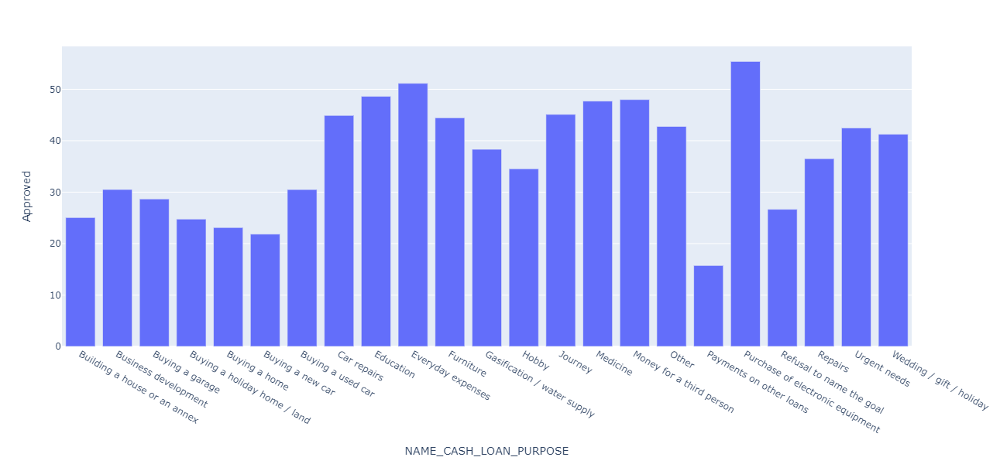

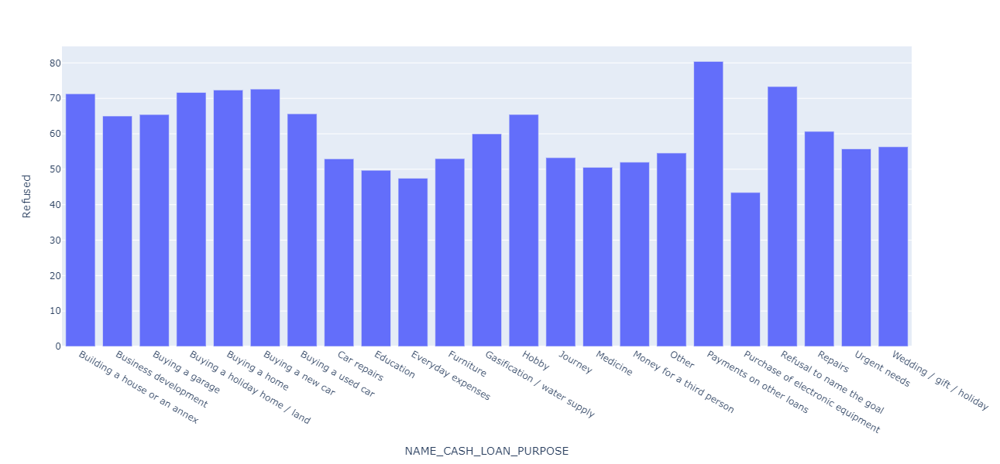

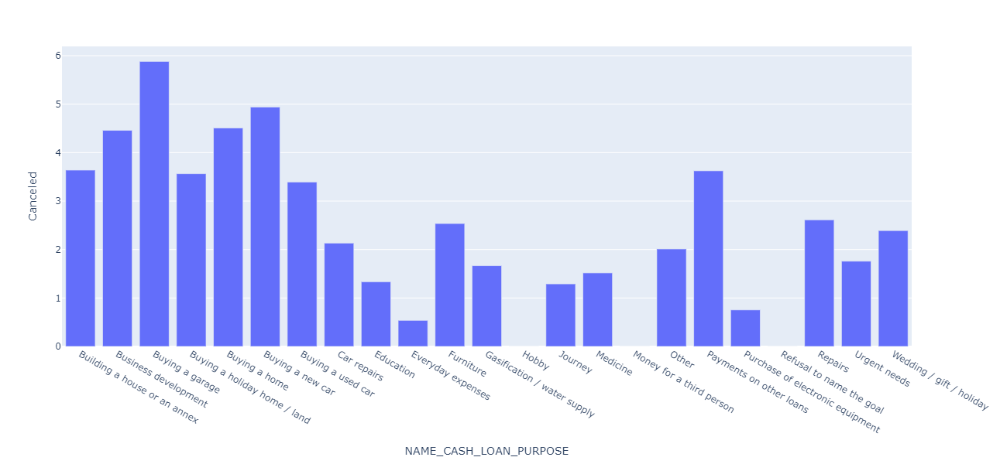

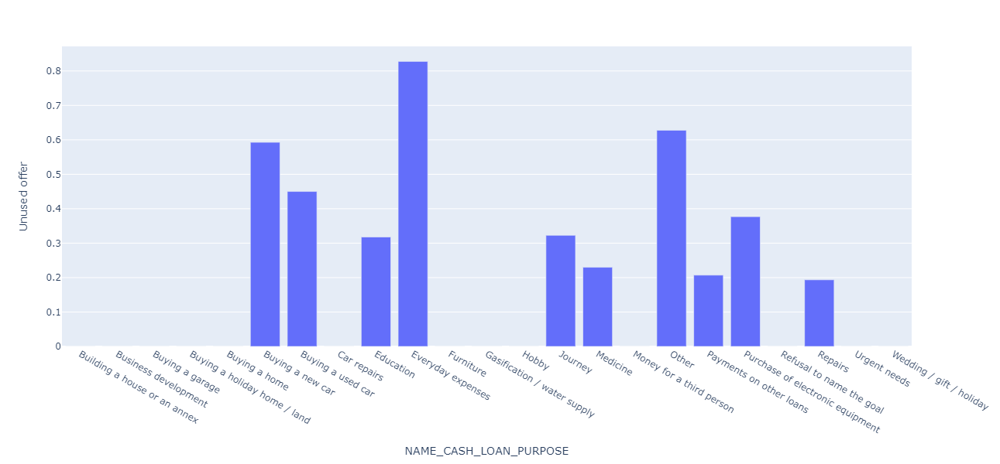

In [124]:
for col in status:
    fig = px.bar(df_status,
                x=df_status.index,
                y=col,
                 height= 600,
                 width= 800
                )
    fig.show()
    print("\n")

# 4. Merging "application_data.csv" and "previous_application_data.csv"

## 4.1 Data understanding

In [181]:
merge_data = pd.merge(left=app_data, right=prev_app_data, how="inner", on="SK_ID_CURR",suffixes="_x")
merge_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE_,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT_,AMT_ANNUITY_,AMT_GOODS_PRICE_,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,AGE,YEARS_EMPLOYED,YEARS_REGISTRATION,YEARS_ID_PUBLISH,OWN_CAR_AGE,FLAG_EMP_PHONE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START_,HOUR_APPR_PROCESS_START_,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,AGE_RANGE,AMT_INCOME_TOTAL_RANGE,AMT_CREDIT_RANGE,AMT_GOODS_PRICE_RANGE,SK_ID_PREV,NAME_CONTRACT_TYPEx,AMT_ANNUITYx,AMT_APPLICATION,AMT_CREDITx,AMT_GOODS_PRICEx,WEEKDAY_APPR_PROCESS_STARTx,HOUR_APPR_PROCESS_STARTx,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION
0,100034,0,Revolving loans,M,N,1,0,0.900,1.800000,0.090000,1.800,Working,Higher education,Single / not married,With parents,0.030755,28.331507,2.767123,13.147945,8.260274,NaN,1,Laborers,TUESDAY,16,0,0,0,0,0,0,Business Entity Type 3,0.297914,0.502779,NaN,25-30,0-1L,1L-2L,1L-2L,1390369,Cash loans,22430.430,94500.0,109971.0,94500.0,FRIDAY,11,Y,1,Other,Approved,-599,Cash through the bank,XAP,New,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,6.0,high,Cash Street: high
1,100035,0,Cash loans,F,N,1,0,2.925,6.658920,0.245925,4.770,Commercial associate,Secondary / secondary special,Civil marriage,House / apartment,0.025164,41.863014,7.309589,14.427397,10.375342,NaN,1,Unknown,WEDNESDAY,13,0,0,0,0,0,0,Business Entity Type 3,NaN,0.479987,0.410103,40-45,2L-3L,6L-7L,4L-5L,1344613,Cash loans,33238.800,1260000.0,1260000.0,1260000.0,WEDNESDAY,14,Y,1,Payments on other loans,Refused,-119,Cash through the bank,HC,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,60.0,low_action,Cash Street: low
2,100039,0,Cash loans,M,Y,0,1,3.600,7.333155,0.390690,6.795,Commercial associate,Secondary / secondary special,Married,House / apartment,0.015221,32.038356,5.643836,9.745205,9.745205,3.0,1,Drivers,THURSDAY,10,0,0,0,1,1,0,Self-employed,NaN,0.321745,0.411849,30-35,3L-4L,7L-8L,6L-7L,1077565,Cash loans,52513.515,1350000.0,1487214.0,1350000.0,MONDAY,14,Y,1,Buying a used car,Approved,-695,Cash through the bank,XAP,Refreshed,XNA,Cash,walk-in,Channel of corporate sales,-1,XNA,42.0,low_normal,Cash Street: low
3,100046,0,Revolving loans,M,Y,1,0,1.800,5.400000,0.270000,5.400,Working,Higher education,Married,House / apartment,0.025164,44.180822,4.824658,22.564384,11.758904,3.0,1,Managers,TUESDAY,8,0,0,0,0,0,0,Business Entity Type 3,NaN,0.738053,0.605836,40-45,1L-2L,5L-6L,5L-6L,1223113,Cash loans,28390.635,337500.0,407911.5,337500.0,MONDAY,13,Y,1,Repairs,Approved,-539,Cash through the bank,XAP,New,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,18.0,low_normal,Cash Street: low
4,100046,0,Revolving loans,M,Y,1,0,1.800,5.400000,0.270000,5.400,Working,Higher education,Married,House / apartment,0.025164,44.180822,4.824658,22.564384,11.758904,3.0,1,Managers,TUESDAY,8,0,0,0,0,0,0,Business Entity Type 3,NaN,0.738053,0.605836,40-45,1L-2L,5L-6L,5L-6L,1529558,Cash loans,29053.215,450000.0,555723.0,450000.0,MONDAY,15,Y,1,Repairs,Refused,-449,Cash through the bank,LIMIT,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,low_normal,Cash Street: low


In [182]:
merge_data.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE_', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT_', 'AMT_ANNUITY_', 'AMT_GOODS_PRICE_', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'AGE', 'YEARS_EMPLOYED',
       'YEARS_REGISTRATION', 'YEARS_ID_PUBLISH', 'OWN_CAR_AGE',
       'FLAG_EMP_PHONE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START_',
       'HOUR_APPR_PROCESS_START_', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1',
       'EXT_SOURCE_2', 'EXT_SOURCE_3', 'AGE_RANGE', 'AMT_INCOME_TOTAL_RANGE',
       'AMT_CREDIT_RANGE', 'AMT_GOODS_PRICE_RANGE', 'SK_ID_PREV',
       'NAME_CONTRACT_TYPEx', 'AMT_ANNUITYx', 'AMT_APPLICATION', 'AMT_CREDITx',
       'AMT_GO

In [183]:
app_data.shape

(252137, 39)

In [184]:
prev_app_data.shape

(69635, 26)

In [185]:
# check the merge data shape
merge_data.shape

(51420, 64)

In [186]:
# Delete unwanted columns and rename required columns
merge_data = merge_data.rename({'NAME_CONTRACT_TYPE_' : 'NAME_CONTRACT_TYPE','AMT_CREDIT_':'AMT_CREDIT','AMT_ANNUITY_':'AMT_ANNUITY', 'WEEKDAY_APPR_PROCESS_START_' : 'WEEKDAY_APPR_PROCESS_START','HOUR_APPR_PROCESS_START_':'HOUR_APPR_PROCESS_START','NAME_CONTRACT_TYPEx':'NAME_CONTRACT_TYPE_PREV', 'AMT_CREDITx':'AMT_CREDIT_PREV','AMT_ANNUITYx':'AMT_ANNUITY_PREV', 'WEEKDAY_APPR_PROCESS_STARTx':'WEEKDAY_APPR_PROCESS_START_PREV', 'HOUR_APPR_PROCESS_STARTx':'HOUR_APPR_PROCESS_START_PREV'}, axis=1)
merge_data.drop(['SK_ID_CURR','WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START','REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION','LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY','REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY','WEEKDAY_APPR_PROCESS_START_PREV','HOUR_APPR_PROCESS_START_PREV', 'FLAG_LAST_APPL_PER_CONTRACT','NFLAG_LAST_APPL_IN_DAY'],axis=1,inplace=True)

In [187]:
merge_data.columns

Index(['TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR',
       'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE_', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'AGE', 'YEARS_EMPLOYED',
       'YEARS_REGISTRATION', 'YEARS_ID_PUBLISH', 'OWN_CAR_AGE',
       'FLAG_EMP_PHONE', 'OCCUPATION_TYPE', 'ORGANIZATION_TYPE',
       'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'AGE_RANGE',
       'AMT_INCOME_TOTAL_RANGE', 'AMT_CREDIT_RANGE', 'AMT_GOODS_PRICE_RANGE',
       'SK_ID_PREV', 'NAME_CONTRACT_TYPE_PREV', 'AMT_ANNUITY_PREV',
       'AMT_APPLICATION', 'AMT_CREDIT_PREV', 'AMT_GOODS_PRICEx',
       'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'DAYS_DECISION',
       'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_

In [188]:
# Now we are down with 
merge_data.shape

(51420, 51)

## 4.2 Data Analysis

1. Required functions for visualization
2. NAME_CASH_LOAN_PURPOSE, color = NAME_CONTRACT_STATUS
3. NAME_CONTRACT_STATUS
4. Box plot NAME_CASH_LOAN_PURPOSE vs AMT_CREDIT_PREV, color = NAME_INCOME_TYPE
5. NAME_INCOME_TYPE, OCCUPATION_TYPE, FLAG_OWN_CAR

### 4.2.1 Required functions for visualization

In [189]:
merge_target11 = merge_data[merge_data["TARGET"] == 1] # Defaulters
merge_target10 = merge_data[merge_data["TARGET"] == 0] # Repayer

In [190]:

def merge_feature_plot(col, hue, horizontal=0,log=0):
    if log == 1:
        if horizontal == 1:
            # Target 1
            temp = merge_target11.groupby(col)[hue].value_counts().reset_index(name="Logarithmic Value").sort_values(by="Logarithmic Value", ascending=False)
            df = pd.DataFrame(temp)
            df["Logarithmic Value"] = np.log(df["Logarithmic Value"])
            fig = px.bar(data_frame=df, y=col, x="Logarithmic Value", barmode="group", color= hue, title="Distribution of "+col+" - Target 1", orientation='h', height=1200 )
            fig.show()

            print("\n")

            # Target 0
            temp = merge_target10.groupby(col)[hue].value_counts().reset_index(name="Logarithmic Value").sort_values(by="Logarithmic Value", ascending=False)
            df = pd.DataFrame(temp)
            df["Logarithmic Value"] = np.log(df["Logarithmic Value"])
            fig = px.bar(data_frame=df, y=col, x="Logarithmic Value", barmode="group", color= hue, title="Distribution of "+col+" - Target 0", orientation='h',height=1200)
            fig.show()
        else:
             # Target 1
            temp = merge_target11.groupby(col)[hue].value_counts().reset_index(name="Logarithmic Value").sort_values(by="Logarithmic Value", ascending=False)
            df = pd.DataFrame(temp)
            df["Logarithmic Value"] = np.log(df["Logarithmic Value"])
            fig = px.bar(data_frame=df, x=col, y="Logarithmic Value", barmode="group", color= hue, title="Distribution of "+col+" - Target 1", height= 600)
            fig.show()

            print("\n")

            # Target 0
            temp = merge_target10.groupby(col)[hue].value_counts().reset_index(name="Logarithmic Value").sort_values(by="Logarithmic Value", ascending=False)
            df = pd.DataFrame(temp)
            df["Logarithmic Value"] = np.log(df["Logarithmic Value"])
            fig = px.bar(data_frame=df, x=col, y="Logarithmic Value", barmode="group", color= hue, title="Distribution of "+col+" - Target 0", height= 600 )
            fig.show()
    else:
        if horizontal == 1:
            # Target 1
            temp = merge_target11.groupby(col)[hue].value_counts().reset_index(name="Counts").sort_values(by="Counts", ascending=False)
            df = pd.DataFrame(temp)
            fig = px.bar(data_frame=df, y=col, x="Counts", barmode="group", color= hue, title="Distribution of "+col+" - Target 1", orientation='h', height=1200 )
            fig.show()

            print("\n")

            # Target 0
            temp = merge_target10.groupby(col)[hue].value_counts().reset_index(name="Counts").sort_values(by="Counts", ascending=False)
            df = pd.DataFrame(temp)
            fig = px.bar(data_frame=df, y=col, x="Counts", barmode="group", color= hue, title="Distribution of "+col+" - Target 0", orientation='h',height=1200)
            fig.show()
        else:
             # Target 1
            temp = merge_target11.groupby(col)[hue].value_counts().reset_index(name="Counts").sort_values(by="Counts", ascending=False)
            df = pd.DataFrame(temp)
            fig = px.bar(data_frame=df, x=col, y="Counts", barmode="group", color= hue, title="Distribution of "+col+" - Target 1", height= 600)
            fig.show()

            print("\n")

            # Target 0
            temp = merge_target10.groupby(col)[hue].value_counts().reset_index(name="Counts").sort_values(by="Counts", ascending=False)
            df = pd.DataFrame(temp)
            fig = px.bar(data_frame=df, x=col, y="Counts", barmode="group", color= hue, title="Distribution of "+col+" - Target 0", height= 600 )
            fig.show()
        



In [194]:
#function for plotting repetitive countplots in univariate categorical analysis on the merged df

def univariate_c_merged(col,df,hue,palette,ylog,figsize):
    plt.figure(figsize=figsize)
    ax=sns.countplot(x=col, data=df,hue= hue,palette= palette,order=df[col].value_counts().index)
    

    if ylog:
        plt.yscale('log')
        plt.ylabel("Count (log)",fontsize=15)     
    else:
        plt.ylabel("Count",fontsize=15)       

    plt.title(col , fontsize=20) 
    plt.legend(loc = "upper right")
    plt.xticks(rotation=45, ha='right')
    
    plt.show()

### 4.2.2 NAME_CASH_LOAN_PURPOSE, color = NAME_CONTRACT_STATUS

- Loan taken for the purpose of Repairs looks to have highest default rate Huge number application have been rejected by bank or refused by client which are applied for Repair or Other. 
- From this we can infer that repair is considered high risk by bank. Also, either they are rejected or bank offers loan on high interest rate which is not feasible by the clients and they refuse the loan.
- There are few places where loan payment is significant higher than facing difficulties. They are 'Buying a garage', 'Business developemt', 'Buying land','Buying a new car' and 'Education' Hence we can focus on these purposes for which the client is having for minimal payment difficulties.

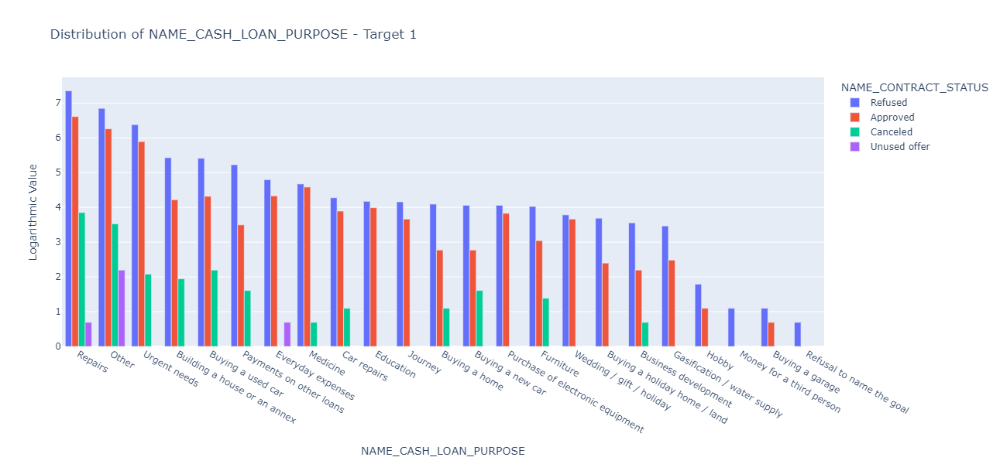

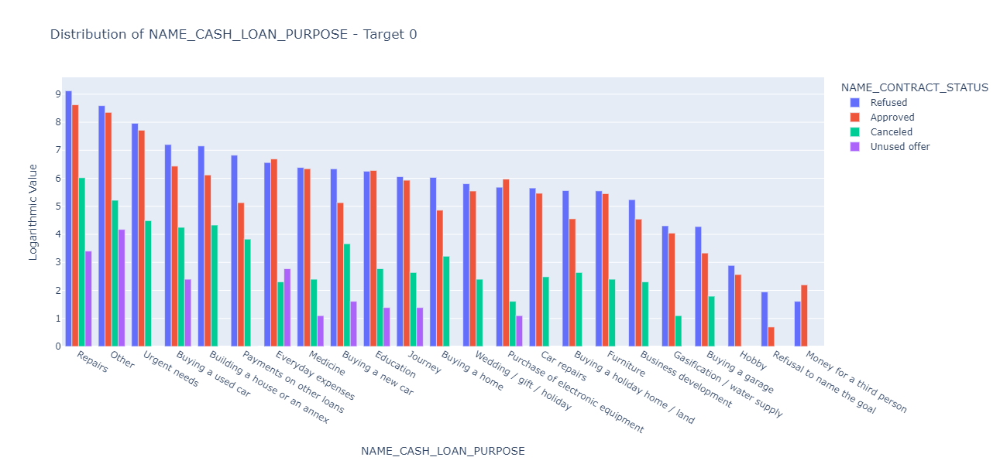

In [191]:
merge_feature_plot("NAME_CASH_LOAN_PURPOSE","NAME_CONTRACT_STATUS",0,1)

### 4.2.3 NAME_CONTRACT_STATUS

- 90% of the previously cancelled client have actually repayed the loan. Revising the interest rates would increase business opportunity for these clients88% of the clients who have been previously refused a loan has payed back the loan in current case.Refusal reason should be recorded for further analysis as these clients could turn into potential repaying customer.

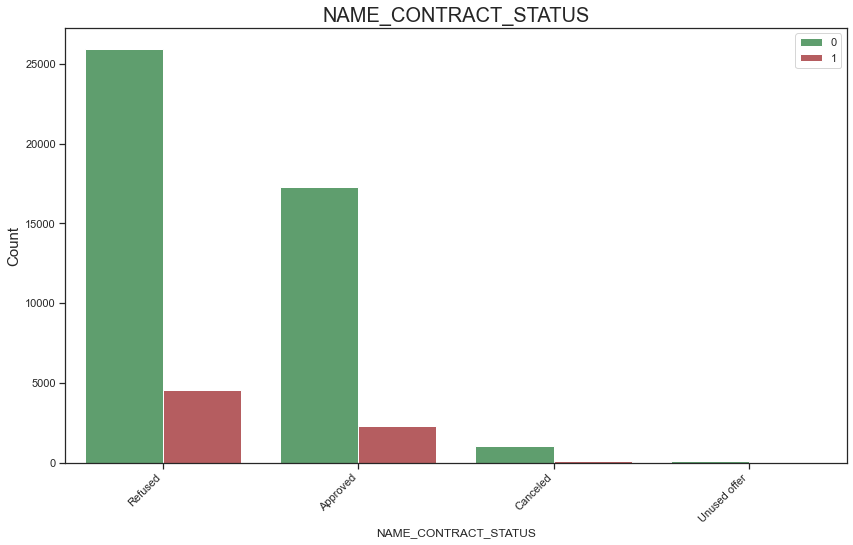

In [196]:
# Checking Contract Status based on loan repayment status whether there is any business loss or financial loss

univariate_c_merged("NAME_CONTRACT_STATUS",merge_data,"TARGET",['g','r'],False,(14,8))

### 4.2.4 Box plot NAME_CASH_LOAN_PURPOSE vs AMT_CREDIT_PREV, color = NAME_INCOME_TYPE

- Credit amount loan is higher for purposes like Buying a new car, Buying a holiday home/land, Buying a house or an annex, Buying a home

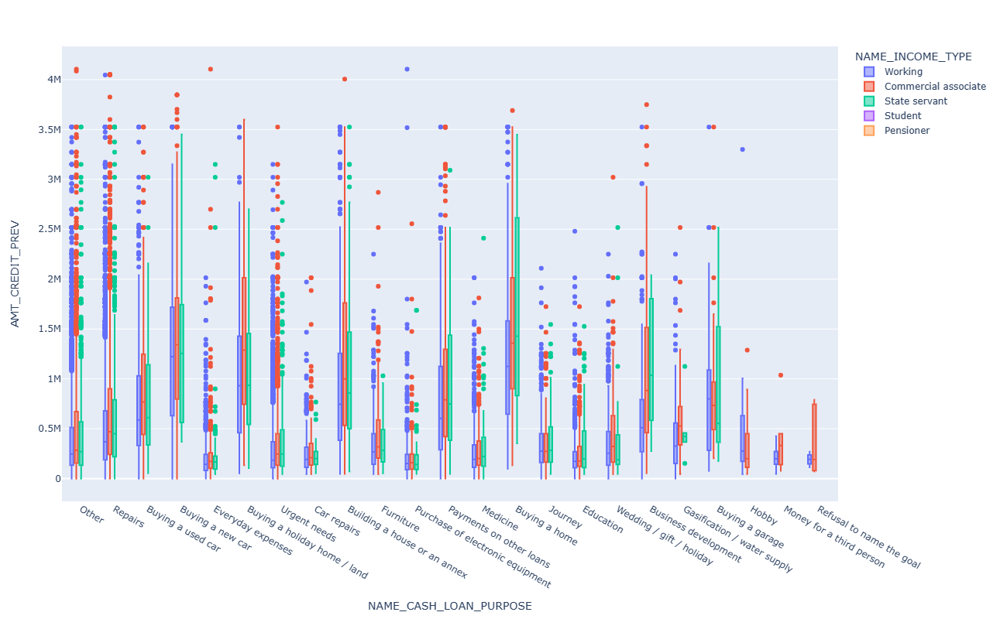

In [198]:
fig = px.box(merge_data, x="NAME_CASH_LOAN_PURPOSE", y="AMT_CREDIT_PREV", color="NAME_INCOME_TYPE",height=800)
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

### 4.2.5 NAME_INCOME_TYPE, OCCUPATION_TYPE, FLAG_OWN_CAR

- Banks should focus less on income type ‘Working’ as they are having most number of unsuccessful payments
- Female applicants without car are the most defaulters
- Working , commercial and state servants are mostly defaulters.
- Labourers are most defaulters

In [203]:
group = ['NAME_INCOME_TYPE', "OCCUPATION_TYPE", "FLAG_OWN_CAR"]

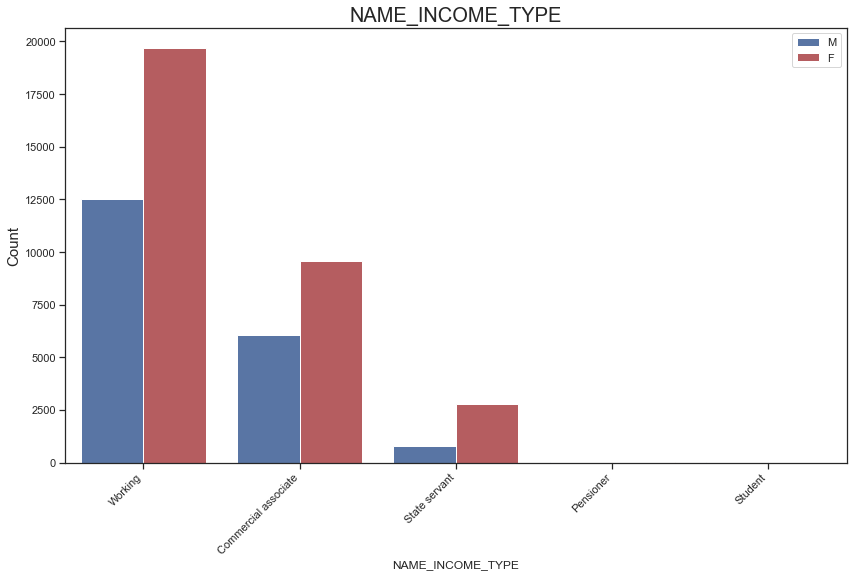

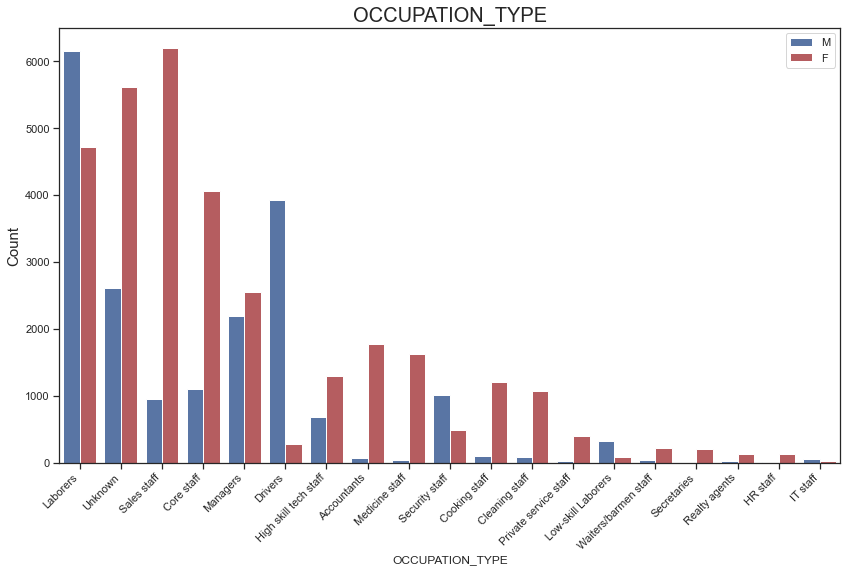

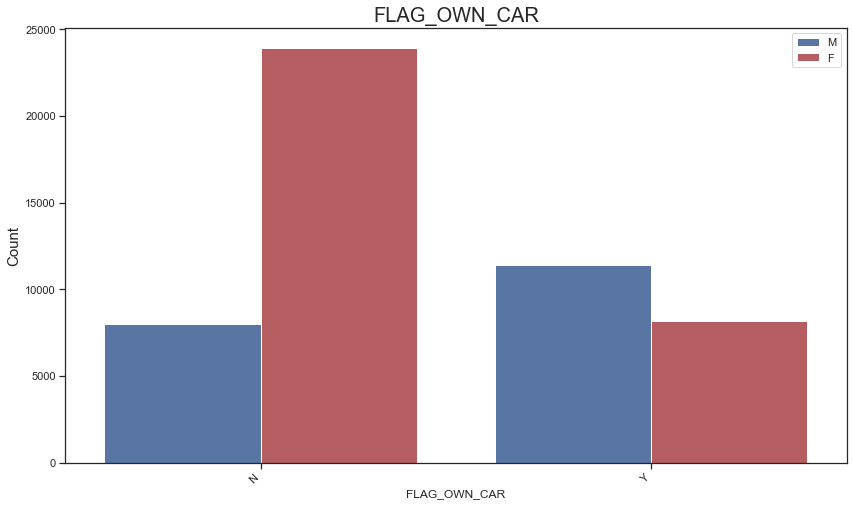

In [204]:
for col in group:
    univariate_c_merged(col,merge_data,"CODE_GENDER",['b','r'],False,(14,8))

-----
# ------------------------------------------- End Of Analysis --------------------------------------------